## Nurses Stress Data

### preparing Data

In [1]:
#!pip install shap 

In [1]:
import math
import os
#import machine_learning_datasets as mldatasets
import numpy as np
import pandas as pd
from sklearn import preprocessing, metrics
from sklearn.model_selection import train_test_split
import tensorflow as tf
#tf.compat.v1.disable_v2_behavior()
from tensorflow import keras
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
import shap  

In [2]:
## You will find how to upload the data into the directory in week 1 scp command
## access the directory on your computer then use the method below:
## scp merged_data.csv up2145253@mn01.soc.uni.ds.port.ac.uk:/home/up2145253/NurseStress

file = "/home/up2145253/NurseStress/merged_data.csv"
largedataset = pd.read_csv(file)

Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.


In [3]:
largedataset.head()

,X,Y,Z,EDA,HR,TEMP,id,datetime,label
0,-13.0,-61.0,5.0,6.769995,99.43,31.17,15,2020-07-08 14:03:00.000000000,2.0
1,-20.0,-69.0,-3.0,6.769995,99.43,31.17,15,2020-07-08 14:03:00.031249920,2.0
2,-31.0,-78.0,-15.0,6.769995,99.43,31.17,15,2020-07-08 14:03:00.062500096,2.0
3,-47.0,-65.0,-38.0,6.769995,99.43,31.17,15,2020-07-08 14:03:00.093750016,2.0
4,-67.0,-57.0,-53.0,6.769995,99.43,31.17,15,2020-07-08 14:03:00.124999936,2.0


### Understanding the Nurse Dataset

In [4]:
dataset = largedataset.copy()

dataset.drop(["X","Y", "Z"], axis = 1, inplace = True)
dataset.head()

,EDA,HR,TEMP,id,datetime,label
0,6.769995,99.43,31.17,15,2020-07-08 14:03:00.000000000,2.0
1,6.769995,99.43,31.17,15,2020-07-08 14:03:00.031249920,2.0
2,6.769995,99.43,31.17,15,2020-07-08 14:03:00.062500096,2.0
3,6.769995,99.43,31.17,15,2020-07-08 14:03:00.093750016,2.0
4,6.769995,99.43,31.17,15,2020-07-08 14:03:00.124999936,2.0


In [5]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11509051 entries, 0 to 11509050
Data columns (total 6 columns):
 #   Column    Dtype  
---  ------    -----  
 0   EDA       float64
 1   HR        float64
 2   TEMP      float64
 3   id        object 
 4   datetime  object 
 5   label     float64
dtypes: float64(4), object(2)
memory usage: 526.8+ MB


In [ ]:
dataset['label'].value_counts()

In [8]:
dataset['datetime'] = pd.to_datetime(dataset['datetime'])

In [6]:
num_duplicated_rows = dataset.duplicated().sum()
num_duplicated_rows

num_duplicated_rows/len(dataset) * 100

dataset.drop_duplicates(inplace=True)

In [7]:
# prompt: split "datetime" to two columns
import datetime

dataset['date'] = pd.to_datetime(dataset['datetime']).dt.date
dataset['time'] = pd.to_datetime(dataset['datetime']).dt.time

In [8]:
dataset.drop(["datetime"], axis = 1, inplace = True)

In [12]:
dataset.head()

,EDA,HR,TEMP,id,label,date,time
0,6.769995,99.43,31.17,15,2.0,2020-07-08,14:03:00
1,6.769995,99.43,31.17,15,2.0,2020-07-08,14:03:00.031249
2,6.769995,99.43,31.17,15,2.0,2020-07-08,14:03:00.062500
3,6.769995,99.43,31.17,15,2.0,2020-07-08,14:03:00.093750
4,6.769995,99.43,31.17,15,2.0,2020-07-08,14:03:00.124999


In [54]:
# prompt: make time to minutes

dataset['time(s)'] = dataset['time'].apply(lambda x: x.second)
dataset['time(m)'] = dataset['time'].apply(lambda x: x.minute)
dataset['time(h)'] = dataset['time'].apply(lambda x: x.hour)

In [ ]:
print(dataset)

In [10]:
dataset['days'] = dataset['date'].apply(lambda x: x.day)
print(dataset)

               EDA     HR   TEMP  id  label        date             time  \
0         6.769995  99.43  31.17  15    2.0  2020-07-08         14:03:00   
1         6.769995  99.43  31.17  15    2.0  2020-07-08  14:03:00.031249   
2         6.769995  99.43  31.17  15    2.0  2020-07-08  14:03:00.062500   
3         6.769995  99.43  31.17  15    2.0  2020-07-08  14:03:00.093750   
4         6.769995  99.43  31.17  15    2.0  2020-07-08  14:03:00.124999   
...            ...    ...    ...  ..    ...         ...              ...   
11509046  3.386070  88.37  33.77  F5    2.0  2020-07-23  17:28:59.875000   
11509047  3.386070  88.37  33.77  F5    2.0  2020-07-23  17:28:59.906249   
11509048  3.386070  88.37  33.77  F5    2.0  2020-07-23  17:28:59.937499   
11509049  3.386070  88.37  33.77  F5    2.0  2020-07-23  17:28:59.968750   
11509050  3.374543  88.33  33.75  F5    2.0  2020-07-23         17:29:00   

          time(s)  time(m)  days  
0               0        3     8  
1               0

In [55]:
df = dataset.copy()

In [56]:
df.drop(["date","time", "time(s)", "days"], axis = 1, inplace = True)

In [18]:
print(df)
df.info()

               EDA     HR   TEMP  id  label  time(m)
0         6.769995  99.43  31.17  15    2.0        3
1         6.769995  99.43  31.17  15    2.0        3
2         6.769995  99.43  31.17  15    2.0        3
3         6.769995  99.43  31.17  15    2.0        3
4         6.769995  99.43  31.17  15    2.0        3
...            ...    ...    ...  ..    ...      ...
11509046  3.386070  88.37  33.77  F5    2.0       28
11509047  3.386070  88.37  33.77  F5    2.0       28
11509048  3.386070  88.37  33.77  F5    2.0       28
11509049  3.386070  88.37  33.77  F5    2.0       28
11509050  3.374543  88.33  33.75  F5    2.0       29

[11403445 rows x 6 columns]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 11403445 entries, 0 to 11509050
Data columns (total 6 columns):
 #   Column   Dtype  
---  ------   -----  
 0   EDA      float64
 1   HR       float64
 2   TEMP     float64
 3   id       object 
 4   label    float64
 5   time(m)  int64  
dtypes: float64(4), int64(1), object(1)
memor

In [ ]:
# count null values
print(df.isnull().sum(), df['id'].nunique())

EDA        0
HR         0
TEMP       0
id         0
label      0
time(m)    0
dtype: int64 18


In [ ]:
max_rows1 = df.loc[df.groupby("id")["time(m)"].idxmax()]
print(max_rows1)

                EDA      HR   TEMP  id  label  time(m)
192005     2.388748   87.35  35.11  15    2.0       59
4288042    3.780758   95.87  34.45  83    2.0       59
6117266    1.629007   89.52  33.73  94    0.0       59
268808     3.617587   81.83  32.29  15    2.0       59
414733     0.429117   60.17  28.77  5C    1.0       59
1200021    0.522374   76.00  30.19  6B    0.0       59
2019810    0.467896   90.83  32.16  6D    2.0       59
2605413    4.013721   79.27  34.33  7A    2.0       59
3994275    0.647183   77.18  34.81  7E    0.0       59
5570560    2.266320   89.23  35.03  83    2.0       59
5601341    0.579533   75.17  31.63  8B    2.0       59
6027024   32.259468  129.82  36.43  94    2.0       59
6664961    0.290722   82.72  34.43  BG    2.0       59
7221775    0.131953   74.57  29.23  CE    2.0       59
8164504    0.090964   66.22  30.93  DF    2.0       59
9058213    6.557088   79.25  34.75  E4    2.0       59
10441501   0.589677   66.07  33.55  EG    2.0       59
10979105  

In [ ]:
## Find out how label is categorized
df2= largedataset.copy()
df2.drop(["X","Y", "Z", "datetime", "id"], axis = 1, inplace = True)
df2.head()

avg_ = df2.groupby('label')['EDA', "HR","TEMP"].mean()
print(avg_)

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.


            EDA         HR       TEMP
label                                
0.0    2.950669  86.615423  31.638143
1.0    3.068973  86.452402  31.987733
2.0    3.682631  85.479283  32.408568


### Data Visualization:

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

features = ['EDA', 'HR', 'TEMP', 'time(s)', 'time(m)', 'time(h)']
target = 'label'

# Calculate correlation matrix
correlation_matrix = df3[features + [target]].corr(method='pearson')

# Extract correlation of features with the target variable
correlation_with_target = correlation_matrix[target].drop(target)
print(correlation_with_target)

EDA        0.053214
HR        -0.032983
TEMP       0.135259
time(s)   -0.000266
time(m)   -0.021935
time(h)   -0.260109
Name: label, dtype: float64


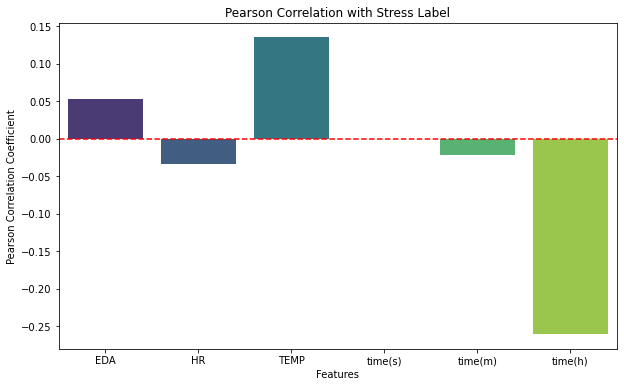

In [27]:
# Create a bar plot for the correlation with target
plt.figure(figsize=(10, 6))
sns.barplot(x=correlation_with_target.index, y=correlation_with_target.values, palette='viridis')
plt.xlabel('Features')
plt.ylabel('Pearson Correlation Coefficient')
plt.title('Pearson Correlation with Stress Label')
plt.axhline(0, color='r', linestyle='--')
plt.show()

In [29]:
from scipy import stats

t_values = {}
p_values = {}

# Perform t-tests for each feature
for feature in features:
    t_stat, p_val = stats.ttest_ind(df3[df3[target] == 0][feature], df3[df3[target] != 0][feature])
    t_values[feature] = t_stat
    p_values[feature] = p_val

# Print the t-values and p-values
print("T-values:", t_values)
print("P-values:", p_values)

T-values: {'EDA': -159.2502929998807, 'HR': 98.25770657756541, 'TEMP': -433.86005556705334, 'time(s)': 0.7289575046933526, 'time(m)': 42.10934805720298, 'time(h)': 760.8127224651458}
P-values: {'EDA': 0.0, 'HR': 0.0, 'TEMP': 0.0, 'time(s)': 0.4660276721352101, 'time(m)': 0.0, 'time(h)': 0.0}


In [30]:
# Convert to DataFrame for easier interpretation
p_values_df = pd.DataFrame(list(p_values.items()), columns=['Feature', 'P-value'])
t_values_df = pd.DataFrame(list(t_values.items()), columns=['Feature', 'T-value'])

# Merge t-values and p-values
results_df = pd.merge(t_values_df, p_values_df, on='Feature')

# Sort by p-value
results_df = results_df.sort_values(by='P-value')

# Print the sorted results
print(results_df)

   Feature     T-value   P-value
0      EDA -159.250293  0.000000
1       HR   98.257707  0.000000
2     TEMP -433.860056  0.000000
4  time(m)   42.109348  0.000000
5  time(h)  760.812722  0.000000
3  time(s)    0.728958  0.466028


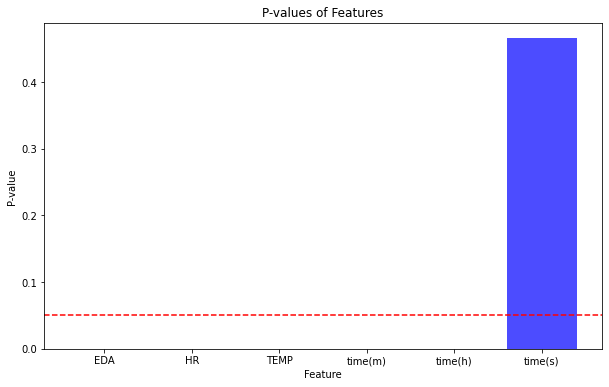

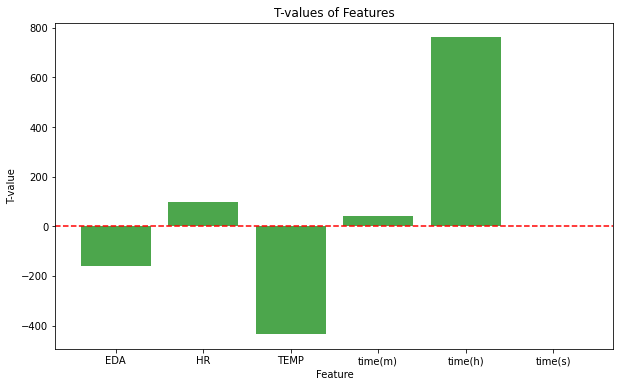

In [31]:
plt.figure(figsize=(10, 6))
plt.bar(results_df['Feature'], results_df['P-value'], color='blue', alpha=0.7)
plt.xlabel('Feature')
plt.ylabel('P-value')
plt.title('P-values of Features')
plt.axhline(y=0.05, color='r', linestyle='--')
plt.show()

# Bar plot for t-values
plt.figure(figsize=(10, 6))
plt.bar(results_df['Feature'], results_df['T-value'], color='green', alpha=0.7)
plt.xlabel('Feature')
plt.ylabel('T-value')
plt.title('T-values of Features')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

In [32]:
import cvxopt as cv
import cvxopt.solvers

def cvxEDA(y, delta, tau0=2., tau1=0.7, delta_knot=10., alpha=8e-4, gamma=1e-2,
           solver=None, options={'reltol':1e-9}):
    """CVXEDA Convex optimization approach to electrodermal activity processing

    This function implements the cvxEDA algorithm described in "cvxEDA: a
    Convex Optimization Approach to Electrodermal Activity Processing"
    (http://dx.doi.org/10.1109/TBME.2015.2474131, also available from the
    authors' homepages).

    Arguments:
       y: observed EDA signal (we recommend normalizing it: y = zscore(y))
       delta: sampling interval (in seconds) of y
       tau0: slow time constant of the Bateman function
       tau1: fast time constant of the Bateman function
       delta_knot: time between knots of the tonic spline function
       alpha: penalization for the sparse SMNA driver
       gamma: penalization for the tonic spline coefficients
       solver: sparse QP solver to be used, see cvxopt.solvers.qp
       options: solver options, see:
                http://cvxopt.org/userguide/coneprog.html#algorithm-parameters

    Returns (see paper for details):
       r: phasic component
       p: sparse SMNA driver of phasic component
       t: tonic component
       l: coefficients of tonic spline
       d: offset and slope of the linear drift term
       e: model residuals
       obj: value of objective function being minimized (eq 15 of paper)
    """

    n = len(y)
    y = cv.matrix(y)

    # bateman ARMA model
    a1 = 1./min(tau1, tau0) 
    a0 = 1./max(tau1, tau0)
    ar = np.array([(a1*delta + 2.) * (a0*delta + 2.), 2.*a1*a0*delta**2 - 8.,
        (a1*delta - 2.) * (a0*delta - 2.)]) / ((a1 - a0) * delta**2)
    ma = np.array([1., 2., 1.])

    # matrices for ARMA model
    i = np.arange(2, n)
    A = cv.spmatrix(np.tile(ar, (n-2,1)), np.c_[i,i,i], np.c_[i,i-1,i-2], (n,n))
    M = cv.spmatrix(np.tile(ma, (n-2,1)), np.c_[i,i,i], np.c_[i,i-1,i-2], (n,n))

    # spline
    delta_knot_s = int(round(delta_knot / delta))
    spl = np.r_[np.arange(1.,delta_knot_s), np.arange(delta_knot_s, 0., -1.)] # order 1
    spl = np.convolve(spl, spl, 'full')
    spl /= max(spl)
    # matrix of spline regressors
    i = np.c_[np.arange(-(len(spl)//2), (len(spl)+1)//2)] + np.r_[np.arange(0, n, delta_knot_s)]
    nB = i.shape[1]
    j = np.tile(np.arange(nB), (len(spl),1))
    p = np.tile(spl, (nB,1)).T
    valid = (i >= 0) & (i < n)
    B = cv.spmatrix(p[valid], i[valid], j[valid])

    # trend
    C = cv.matrix(np.c_[np.ones(n), np.arange(1., n+1.)/n])
    nC = C.size[1]

    # Solve the problem:
    # .5*(M*q + B*l + C*d - y)^2 + alpha*sum(A,1)*p + .5*gamma*l'*l
    # s.t. A*q >= 0

    old_options = cv.solvers.options.copy()
    cv.solvers.options.clear()
    cv.solvers.options.update(options)
    if solver == 'conelp':
        # Use conelp
        z = lambda m,n: cv.spmatrix([],[],[],(m,n))
        G = cv.sparse([[-A,z(2,n),M,z(nB+2,n)],[z(n+2,nC),C,z(nB+2,nC)],
                    [z(n,1),-1,1,z(n+nB+2,1)],[z(2*n+2,1),-1,1,z(nB,1)],
                    [z(n+2,nB),B,z(2,nB),cv.spmatrix(1.0, range(nB), range(nB))]])
        h = cv.matrix([z(n,1),.5,.5,y,.5,.5,z(nB,1)])
        c = cv.matrix([(cv.matrix(alpha, (1,n)) * A).T,z(nC,1),1,gamma,z(nB,1)])
        res = cv.solvers.conelp(c, G, h, dims={'l':n,'q':[n+2,nB+2],'s':[]})
        obj = res['primal objective']
    else:
        # Use qp
        Mt, Ct, Bt = M.T, C.T, B.T
        H = cv.sparse([[Mt*M, Ct*M, Bt*M], [Mt*C, Ct*C, Bt*C], 
                    [Mt*B, Ct*B, Bt*B+gamma*cv.spmatrix(1.0, range(nB), range(nB))]])
        f = cv.matrix([(cv.matrix(alpha, (1,n)) * A).T - Mt*y,  -(Ct*y), -(Bt*y)])
        res = cv.solvers.qp(H, f, cv.spmatrix(-A.V, A.I, A.J, (n,len(f))),
                            cv.matrix(0., (n,1)), solver=solver)
        obj = res['primal objective'] + .5 * (y.T * y)
    cv.solvers.options.clear()
    cv.solvers.options.update(old_options)

    l = res['x'][-nB:]
    d = res['x'][n:n+nC]
    t = B*l + C*d
    q = res['x'][:n]
    p = A * q
    r = M * q
    e = y - r - t

    return (np.array(a).ravel() for a in (r, p, t, l, d, e, obj))

In [ ]:
# Extract EDA values
eda_values = df3['EDA'].astype(int).values

delta = 0.01 
alpha = None

# Apply cvxEDA algorithm to extract phasic and tonic components
[t, r, filtered_eda, _] = cvxEDA(eda_values, delta)

# Plot the original EDA signal, phasic, and tonic components
plt.figure(figsize=(10, 6))
plt.plot(df3['time(m)'], eda_values, label='Original EDA')
plt.plot(df3['time(m)'], filtered_eda, label='Filtered EDA')
plt.plot(df3['time(m)'], t, label='Tonic Component')
plt.plot(df3['time(m)'], r, label='Phasic Component')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.title('cvxEDA Analysis')
plt.show()

In [34]:
# Extract EDA values
eda_values = df3['EDA'].astype(int).values

delta = 0.01 
alpha = None

# Apply cvxEDA algorithm to extract phasic and tonic components
[t, r] = cvxEDA(eda_values, delta)

# Plot the original EDA signal, phasic, and tonic components
plt.figure(figsize=(10, 6))
plt.plot(df3['Time(m)'], r, label='Tonic Component')
plt.plot(df3['Time(m)'], t, label='Phasic Component')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.title('cvxEDA Analysis')
plt.show()

     pcost       dcost       gap    pres   dres
 0: -2.3517e+08 -2.3467e+08  8e+08  3e+04  2e-02
 1: -2.3543e+08 -4.1724e+08  2e+08  7e+03  3e-03
 2: -2.3556e+08 -3.4183e+08  1e+08  3e+03  2e-03
 3: -2.3558e+08 -3.3645e+08  1e+08  3e+03  1e-03
 4: -2.3563e+08 -2.7809e+08  4e+07  1e+03  5e-04
 5: -2.3564e+08 -2.7698e+08  4e+07  9e+02  4e-04
 6: -2.3566e+08 -2.5716e+08  2e+07  4e+02  2e-04
 7: -2.3565e+08 -2.5700e+08  2e+07  4e+02  2e-04
 8: -2.3564e+08 -2.4721e+08  1e+07  2e+02  8e-05
 9: -2.3563e+08 -2.4626e+08  1e+07  1e+02  7e-05
10: -2.3559e+08 -2.4250e+08  7e+06  7e+01  3e-05
11: -2.3558e+08 -2.4220e+08  7e+06  6e+01  3e-05
12: -2.3555e+08 -2.3923e+08  4e+06  3e+01  1e-05
13: -2.3554e+08 -2.3909e+08  4e+06  3e+01  1e-05
14: -2.3551e+08 -2.3738e+08  2e+06  1e+01  6e-06
15: -2.3549e+08 -2.3712e+08  2e+06  9e+00  4e-06
16: -2.3560e+08 -2.3607e+08  5e+05  1e+00  7e-07
17: -2.3566e+08 -2.3601e+08  4e+05  9e-01  5e-07
18: -2.3574e+08 -2.3596e+08  2e+05  5e-01  3e-07
19: -2.3580e+08 -2.35

ValueError: too many values to unpack (expected 3)

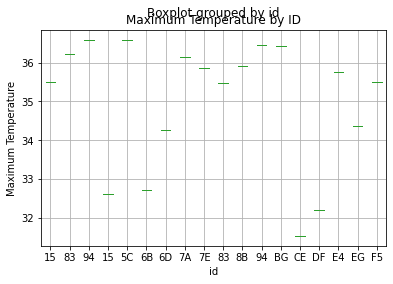

In [22]:
# Group the data by ID and calculate the maximum temperature for each group
max_temps = df.groupby("id")["TEMP"].max()

# Convert the maximum temperature data to a pandas DataFrame
max_temps_merged_df = pd.DataFrame(max_temps)

# Create a boxplot with the maximum temperature data, with the ID on the x-axis
max_temps_merged_df.boxplot(column="TEMP", by="id")

# Set the axis labels and title
plt.xlabel("id")
plt.ylabel("Maximum Temperature")
plt.title("Maximum Temperature by ID")

# Display the plot
plt.show()

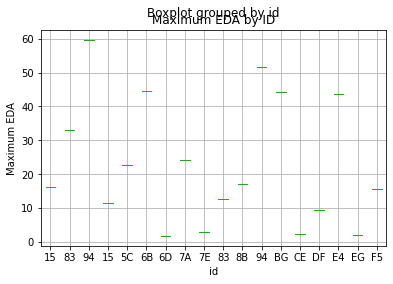

In [23]:
# Group the data by ID and calculate the maximum temperature for each group
max_EDA = df.groupby("id")["EDA"].max()

# Convert the maximum temperature data to a pandas DataFrame
max_temps_merged_df = pd.DataFrame(max_EDA)

# Create a boxplot with the maximum temperature data, with the ID on the x-axis
max_temps_merged_df.boxplot(column="EDA", by="id")

# Set the axis labels and title
plt.xlabel("id")
plt.ylabel("Maximum EDA")
plt.title("Maximum EDA by ID")

# Display the plot
plt.show()

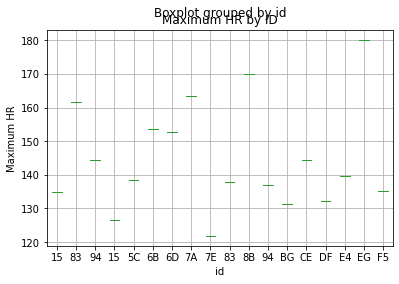

In [24]:
# Group the data by ID and calculate the maximum temperature for each group
max_HR = df.groupby("id")["HR"].max()

# Convert the maximum temperature data to a pandas DataFrame
max_temps_merged_df = pd.DataFrame(max_HR )

# Create a boxplot with the maximum temperature data, with the ID on the x-axis
max_temps_merged_df.boxplot(column="HR", by="id")

# Set the axis labels and title
plt.xlabel("id")
plt.ylabel("Maximum HR")
plt.title("Maximum HR by ID")

# Display the plot
plt.show()

In [ ]:
from cvxEDA import cvxEDA

# Sample EDA data (replace with your own EDA data)
eda_data = np.random.rand(100)  # Example EDA data (replace with actual data)
time_points = np.arange(len(eda_data))  # Time points corresponding to EDA data

# Apply cvxEDA algorithm
phasic, tonic, _ = cvxEDA(eda_data, time_points)

# Plot EDA vs Time
plt.figure(figsize=(10, 6))
plt.plot(time_points, eda_data, label='EDA Data', color='blue')
plt.plot(time_points, phasic, label='Phasic Component', color='red', linestyle='--')
plt.plot(time_points, tonic, label='Tonic Component', color='green', linestyle='--')
plt.xlabel('Time')
plt.ylabel('EDA')
plt.title('EDA vs Time')
plt.legend()
plt.show()

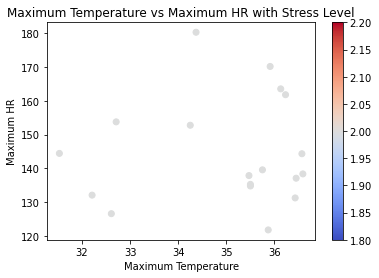

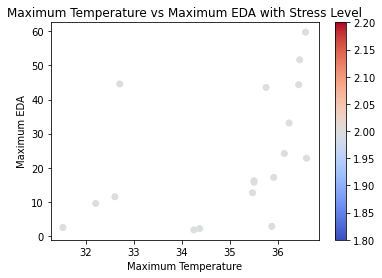

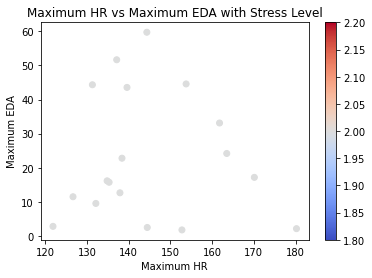

In [25]:
# Get the maximum values of temperature, HR, and EDA for each individual
max_temp_rows = df.loc[df.groupby("id")["TEMP"].idxmax()]
max_hr = df.groupby("id")["HR"].max()
max_eda = df.groupby("id")["EDA"].max()

# Create scatter plots for the relationships between maximum temperature, maximum HR, and maximum EDA with the stress level as the color
plt.scatter(max_temp_rows["TEMP"], max_hr, c=df.groupby("id")["label"].max(), cmap="coolwarm")
plt.xlabel("Maximum Temperature")
plt.ylabel("Maximum HR")
plt.title("Maximum Temperature vs Maximum HR with Stress Level")
plt.colorbar()
plt.show()

plt.scatter(max_temp_rows["TEMP"], max_eda, c=df.groupby("id")["label"].max(), cmap="coolwarm")
plt.xlabel("Maximum Temperature")
plt.ylabel("Maximum EDA")
plt.title("Maximum Temperature vs Maximum EDA with Stress Level")
plt.colorbar()
plt.show()

plt.scatter(max_hr, max_eda, c=df.groupby("id")["label"].max(), cmap="coolwarm")
plt.xlabel("Maximum HR")
plt.ylabel("Maximum EDA")
plt.title("Maximum HR vs Maximum EDA with Stress Level")
plt.colorbar()
plt.show()

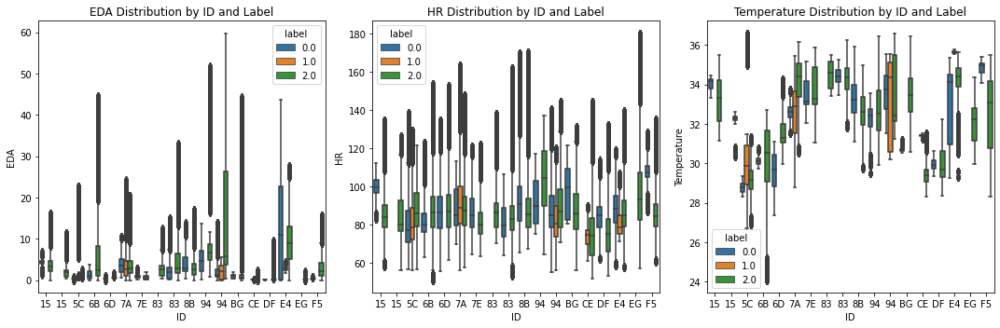

In [26]:
# Create a figure with 3 subplots arranged horizontally
fig, axs = plt.subplots(1, 3, figsize=(15,5))

# Create a box plot of temperature for each ID, colored by label
sns.boxplot(x="id", y="EDA", hue="label", data=largedataset, ax=axs[0])
sns.boxplot(x="id", y="HR", hue="label", data=largedataset, ax=axs[1])
sns.boxplot(x="id", y="TEMP", hue="label", data=largedataset, ax=axs[2])

# Set the axis labels and title for each subplot
axs[0].set_xlabel("ID")
axs[0].set_ylabel("EDA")
axs[0].set_title("EDA Distribution by ID and Label")

axs[1].set_xlabel("ID")
axs[1].set_ylabel("HR")
axs[1].set_title("HR Distribution by ID and Label")

axs[2].set_xlabel("ID")
axs[2].set_ylabel("Temperature")
axs[2].set_title("Temperature Distribution by ID and Label")

# Adjust the layout of the subplots to avoid overlapping
plt.tight_layout()

# Display the plot
plt.show()

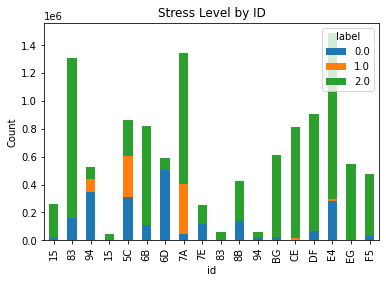

In [27]:
# Count the number of occurrences of each label for each ID
label_counts = df.groupby(['id', 'label']).size().unstack()

# Create a stacked bar chart
label_counts.plot(kind='bar', stacked=True)

# Set the axis labels and title
plt.xlabel('id')
plt.ylabel('Count')
plt.title('Stress Level by ID')

# Display the plot
plt.show()

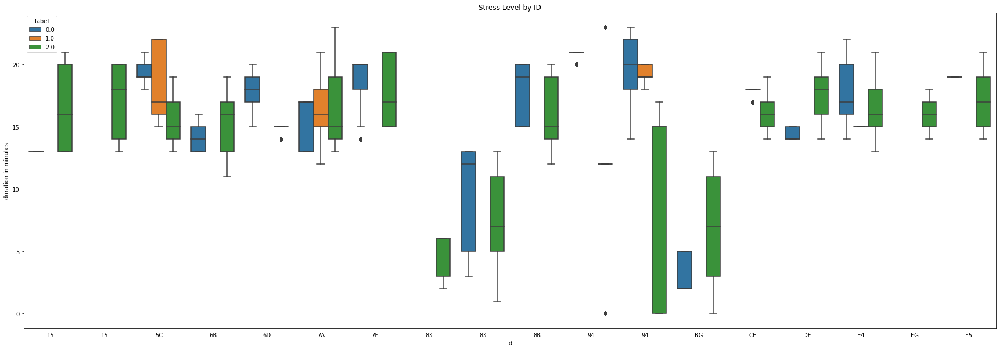

In [57]:
# Count the number of occurrences of each label for each ID
#Stress_duration = df.groupby(['id', 'time(m)']).size().unstack()
fig, axs = plt.subplots(figsize=(30,10))
sns.boxplot(x="id", y="time(h)", hue="label", data=df, ax=axs)

# Set the axis labels and title
plt.xlabel('id')
plt.ylabel('duration in hours')
plt.title('Stress Level by ID')

# Display the plot
plt.show()

In [42]:
# Count the number of occurrences of each label for each ID
#Stress_duration = pd.DataFrame(df['id'], df['time(m)'], index=label)

#df.plot(x="id", y="time(m)", hue="label", data=df)

# Set the axis labels and title
#plt.xlabel('id')
#plt.ylabel('duration in minutes')
#plt.title('Stress Level by ID')

# Display the plot
#plt.show()

label       0.0       1.0        2.0
id                                  
15      13441.0       NaN   248703.0
83     163204.0       NaN  1147516.0
94     348873.0   87458.0    87956.0
15          NaN       NaN    46987.0
5C     309121.0  295685.0   261124.0
6B     107522.0       NaN   710346.0
6D     503041.0       NaN    88322.0
7A      46082.0  355876.0   942743.0
7E     117124.0       NaN   136323.0
83          NaN       NaN    62099.0
8B     138243.0       NaN   285520.0
94      17279.0       NaN    44529.0
BG      21122.0       NaN   587533.0
CE          NaN   19201.0   794886.0
DF      65282.0       NaN   842886.0
E4     281190.0   15361.0  1189399.0
EG          NaN       NaN   549124.0
F5      30721.0       NaN   441623.0


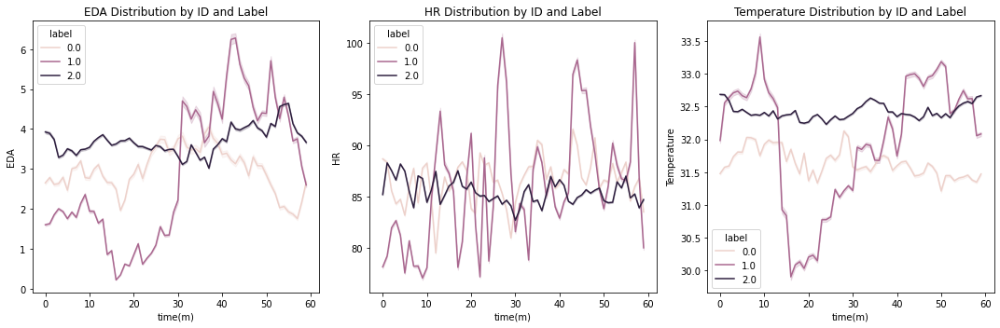

In [28]:
# Create a figure with 3 subplots arranged horizontally
fig, axs = plt.subplots(1, 3, figsize=(15,5))

# Create a box plot of temperature for each ID, colored by label
sns.lineplot(x="time(m)", y="EDA", hue="label",  data=df, ax=axs[0])
sns.lineplot(x="time(m)", y="HR", hue="label", data=df, ax=axs[1])
sns.lineplot(x="time(m)", y="TEMP", hue="label", data=df, ax=axs[2])

# Set the axis labels and title for each subplot
axs[0].set_xlabel("time(m)")
axs[0].set_ylabel("EDA")
axs[0].set_title("EDA Distribution by ID and Label")

axs[1].set_xlabel("time(m)")
axs[1].set_ylabel("HR")
axs[1].set_title("HR Distribution by ID and Label")

axs[2].set_xlabel("time(m)")
axs[2].set_ylabel("Temperature")
axs[2].set_title("Temperature Distribution by ID and Label")

# Adjust the layout of the subplots to avoid overlapping
plt.tight_layout()

# Display the plot
plt.show()

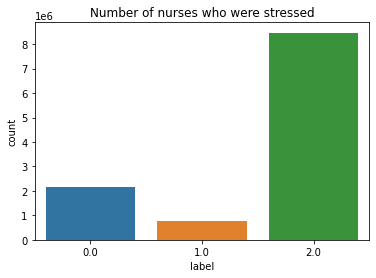

In [29]:
sns.countplot(x='label',data=df)
plt.title('Number of nurses who were stressed')
plt.show()

### Data Procssing 

In [6]:
df3 = largedataset.copy()

num_duplicated_rows = df3.duplicated().sum()
num_duplicated_rows

105606

In [7]:
num_duplicated_rows/len(df3) * 100

0.9175908595765194

In [8]:
df3.drop_duplicates(inplace=True)

In [9]:
import time

df3['datetime'] = pd.to_datetime(df3['datetime'])
df3['time(s)'] = df3['datetime'].apply(lambda x: x.second)
df3['time(m)'] = df3['datetime'].apply(lambda x: x.minute)
df3['time(h)'] = df3['datetime'].apply(lambda x: x.hour)
df3['day'] = df3['datetime'].apply(lambda x: x.day)
df3['month'] = df3['datetime'].apply(lambda x: x.month)
df3['year'] = df3['datetime'].apply(lambda x: x.year)


In [10]:
df3.drop(['datetime', 'day', 'year','month','X','Y','Z'],axis=1, inplace=True)
df3.drop(["id"], axis = 1, inplace = True)

In [11]:
df3.head()

,EDA,HR,TEMP,label,time(s),time(m),time(h)
0,6.769995,99.43,31.17,2.0,0,3,14
1,6.769995,99.43,31.17,2.0,0,3,14
2,6.769995,99.43,31.17,2.0,0,3,14
3,6.769995,99.43,31.17,2.0,0,3,14
4,6.769995,99.43,31.17,2.0,0,3,14


In [12]:
df3.dropna(axis = 0, inplace = True)

### Data Modeling 

In [13]:
from sklearn.model_selection import train_test_split

## OverSampling
from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN, BorderlineSMOTE

## UnderSampling
from imblearn.under_sampling import ClusterCentroids, RandomUnderSampler, NearMiss, EditedNearestNeighbours, RepeatedEditedNearestNeighbours, AllKNN, CondensedNearestNeighbour, NeighbourhoodCleaningRule

## Combined under and over sampling
from imblearn.combine import SMOTEENN, SMOTETomek

In [14]:
X = df3.drop("label", axis = 1).values
y = df3['label'].values

## Not enough Samples for 0, 1 in labels
#over_sample = RandomUnderSampler()
#X, y = over_sample.fit_resample(X, y)

In [15]:
## Training the model
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.1, random_state=42)

X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [16]:
## Training the model
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

In [17]:
from imblearn.under_sampling import TomekLinks

over_sample = SMOTETomek(random_state=42)
X_train, y_train = over_sample.fit_resample(X_train, y_train)
#X_val, y_val = over_sample.fit_resample(X_val, y_val)

In [18]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping

#base_model = Dense(X_train.shape[1],activation='relu',input_shape=(X_train.shape[1],))

pre_model = Sequential([
    Dense(X_train.shape[1],activation='relu',input_shape=(X_train.shape[1],)),
    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(3, activation='softmax')
                ])

pre_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

## Feature Scaling
sc = RobustScaler()
X_train = sc.fit_transform(X_train)
X_val = sc.transform(X_val)
X_test = sc.transform(X_test)

In [20]:
initial_epochs = 20
#
history = pre_model.fit(X_train, y_train, validation_data=(X_val,y_val), epochs= initial_epochs, batch_size=1000, callbacks=[early_stop])

Epoch 1/20
22863/22863 [==============================] - 103s 4ms/step - loss: 0.1523 - accuracy: 0.9434 - val_loss: 0.0811 - val_accuracy: 0.9677
Epoch 2/20
22863/22863 [==============================] - 102s 4ms/step - loss: 0.0549 - accuracy: 0.9807 - val_loss: 0.0614 - val_accuracy: 0.9756
Epoch 3/20
22863/22863 [==============================] - 102s 4ms/step - loss: 0.0407 - accuracy: 0.9858 - val_loss: 0.0500 - val_accuracy: 0.9815
Epoch 4/20
22863/22863 [==============================] - 102s 4ms/step - loss: 0.0340 - accuracy: 0.9883 - val_loss: 0.0335 - val_accuracy: 0.9876
Epoch 5/20
22863/22863 [==============================] - 102s 4ms/step - loss: 0.0296 - accuracy: 0.9898 - val_loss: 0.0224 - val_accuracy: 0.9918
Epoch 6/20
22863/22863 [==============================] - 102s 4ms/step - loss: 0.0260 - accuracy: 0.9911 - val_loss: 0.0260 - val_accuracy: 0.9902
Epoch 7/20
22863/22863 [==============================] - 102s 4ms/step - loss: 0.0234 - accuracy: 0.9920 - val_

<AxesSubplot:>

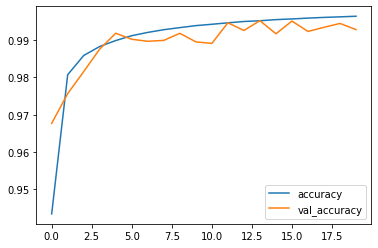

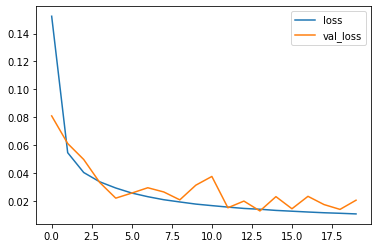

In [21]:
metrics_df = pd.DataFrame(history.history)
metrics_df

# Accuracy
metrics_df[['accuracy','val_accuracy']].plot()

# Loss
metrics_df[['loss','val_loss']].plot()

In [22]:
y_preds = pre_model.predict(X_test)
y_preds

## flattened array
y_true_pred = np.argmax(y_preds, axis=1)
y_true_pred

array([2, 2, 0, ..., 2, 2, 2])

In [23]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_true_pred)
print(cm)
#accuracy_score(y_test, y_true_pred)

[[108229     90     86]
 [     5  38583     12]
 [  2809   1207 419152]]


<AxesSubplot:>

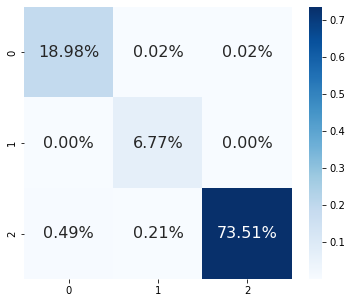

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

cf_matrix = confusion_matrix(y_test, y_true_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,\
            fmt='.2%', cmap='Blues', annot_kws={'size':16})

In [25]:
pre_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 6)                 42        
_________________________________________________________________
dense_1 (Dense)              (None, 256)               1792      
_________________________________________________________________
dense_2 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_3 (Dense)              (None, 3)                 387       
Total params: 35,117
Trainable params: 35,117
Non-trainable params: 0
_________________________________________________________________


In [26]:
pre_model.save('Stress.h5')

In [27]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, r2_score, mean_squared_error

accuracy = accuracy_score(y_test, y_true_pred)
print(f"Accuracy: {accuracy}")

print('Precision:', precision_score(y_test, y_true_pred, average='weighted'))
print('Recall:', recall_score(y_test, y_true_pred, average='weighted'))
print('F1-score:', f1_score(y_test, y_true_pred, average='weighted'))

# Evaluate the model performance using R-squared and RMSE metrics
print('R-squared score for label prediction:', r2_score(y_test, y_true_pred))
print('RMSE for label prediction:', mean_squared_error(y_test, y_true_pred, squared=False))

Accuracy: 0.9926180299663435
Precision: 0.9928066815140013
Recall: 0.9926180299663435
F1-score: 0.9926515640004575
R-squared score for label prediction: 0.9639639781106633
RMSE for label prediction: 0.15038014838016095


In [26]:
## Option test 2:
## Reference: row(20) https://www.kaggle.com/code/osmanballi/transfer-learning-ann-knn-svm-dt

#from keras.models import Model
#new_model = Model(inputs=pre_model.input,outputs=pre_model.get_layer('dense_4').output)

## Students Stress Data

#### Models Reviews:

In [27]:
#!pip install --upgrade rulefit interpret skope-rules six

In [28]:
from sklearn.model_selection import train_test_split
from sklearn import metrics, linear_model, tree, naive_bayes, neighbors, ensemble,\
                    neural_network, svm, decomposition, manifold
from rulefit import RuleFit
import statsmodels.api as sm
from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show
from interpret.perf import ROC
import matplotlib.pyplot as plt
import machine_learning_datasets as mldatasets

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.


In [29]:
from sklearn.pipeline import make_pipeline

In [30]:
rand = 9
class_models = {
        #Generalized Linear Models (GLMs)
        'logistic':{'model': linear_model.LogisticRegression()},
        #Tree
        'decision_tree':{'model': tree.DecisionTreeClassifier(max_depth=7, random_state=rand)},
        #Nearest Neighbors
        'knn':{'model': neighbors.KNeighborsClassifier(n_neighbors=7)},
        #Naive Bayes
        #'naive_bayes':{'model': naive_bayes.GaussianNB()},
        #Ensemble Methods
        #'gradient_boosting':{'model':ensemble.GradientBoostingClassifier(n_estimators=210)},
        'random_forest':{'model': ensemble.RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)},
        #Neural Networks
        'mlp':{'model':make_pipeline(RobustScaler(), neural_network.MLPClassifier(hidden_layer_sizes=(7,), max_iter=20, early_stopping=True, random_state=rand))}
    }

In [31]:
fpr = dict()
tpr = dict()
roc_auc = dict()

for model_name in class_models.keys():
    history = class_models[model_name]['model'].fit(X_train, y_train)
    y_test_pred = history.predict(X_test)
    y_train_pred = history.predict(X_train)
    y_test_prob = history.predict_proba(X_test)
    ###...###
    class_models[model_name]['fitted'] = history
    class_models[model_name]['probs'] = y_test_prob
    class_models[model_name]['preds'] = y_test_pred
    class_models[model_name]['Accuracy_train'] = metrics.accuracy_score(y_train, y_train_pred)
    class_models[model_name]['Accuracy_test'] = metrics.accuracy_score(y_test, y_test_pred)
    class_models[model_name]['Recall_train'] = metrics.recall_score(y_train, y_train_pred, average='weighted')
    class_models[model_name]['Recall_test'] = metrics.recall_score(y_test, y_test_pred, average='weighted')
    class_models[model_name]['F1_test'] = metrics.f1_score(y_test, y_test_pred, average='weighted')
    class_models[model_name]['ROC_AUC_test'] = metrics.roc_auc_score(y_test, y_test_prob, average='weighted', multi_class='ovo')
    class_models[model_name]['MCC_test'] = metrics.matthews_corrcoef(y_test, y_test_pred)

Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.


In [32]:
class_metrics = pd.DataFrame.from_dict(class_models, 'index')[['Accuracy_train', 'Accuracy_test', 'F1_test', 'ROC_AUC_test', 'MCC_test']]
class_metrics.sort_values(by='MCC_test', ascending=False).style.background_gradient(cmap='plasma', low=0.3, high=1, subset=['Accuracy_train', 'Accuracy_test']).\
    background_gradient(cmap='viridis', low=1, high=0.3, subset=['MCC_test'])

,Accuracy_train,Accuracy_test,F1_test,ROC_AUC_test,MCC_test
knn,0.999998,1.000000,1.000000,1.000000,1.000000
random_forest,1.000000,1.000000,1.000000,1.000000,1.000000
decision_tree,0.746649,0.656799,0.701105,0.889111,0.471834
mlp,0.639459,0.546983,0.597203,0.783278,0.322151
logistic,0.443153,0.524294,0.580128,0.682884,0.176864


In [ ]:
## True positive rate
plt.figure(figsize = (12,12))
plt.tick_params(axis = 'both', which = 'major', labelsize = 12)
fpr, tpr, _ = metrics.roc_curve(y_test,  y_test_prob)
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % class_models[model_name]['ROC_AUC_test'])
plt.plot([0, 1], [0, 1], 'k--')  # coin toss line
plt.xlabel('False Positive Rate', fontsize = 14)
plt.ylabel('True Positive Rate', fontsize = 14)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.legend(loc="lower right")

#### Feature Selections using pre_model:

In [ ]:
#coefs_lm = pre_model.coef_
#intercept_lm = pre_model.intercept_
#print('coefficients:\t%s' % coefs_lm)
#print('intercept:\t%s' % intercept_lm)

In [ ]:
coef_df = pd.DataFrame({'feature':X_train.columns.values.tolist(),\
                        'coef': coefs_lm})
print(coef_df)

In [ ]:
linreg_mdl = pre_model.fit()
linreg_mdl.summary

In [ ]:
import statsmodels.api as sm
linreg_mdl =sm.RLM(y_train, sm.add_constant(X_train))
linreg_mdl = linreg_mdl.fit()
linreg_mdl.summary()

In [ ]:
## Linear regression summary table sorted by the absolute value of the t-statistic
summary_df = linreg_mdl.summary2().tables[1]
summary_df = summary_df.drop(['const']).reset_index().rename(columns={'index':'feature'})
summary_df['t_abs'] = abs(summary_df['t'])
summary_df.sort_values(by='t_abs', ascending=False).style.\
    background_gradient(cmap='plasma_r', low=0, high=0.1, subset=['P>|t|']).\
    background_gradient(cmap='plasma_r', low=0, high=0.1, subset=['t_abs'])

#### Interpreting SHAP Summary

In [26]:
background = X_train[np.random.choice(X_train.shape[0], 100, replace=False)]

shap_explainer = shap.KernelExplainer(pre_model, background)

print(background.shape)
#shap_nn_explainer = shap.GradientExplainer(pre_model, background.astype(float).values)

(100, 6)


In [27]:
y_preds.shape

(570173, 3)

In [28]:
pre_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 6)                 42        
_________________________________________________________________
dense_1 (Dense)              (None, 256)               1792      
_________________________________________________________________
dense_2 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_3 (Dense)              (None, 3)                 387       
Total params: 35,117
Trainable params: 35,117
Non-trainable params: 0
_________________________________________________________________


In [29]:
random_indices = np.random.choice(len(X_train), size=5000, replace=False) 
random_indices2 = np.random.choice(len(X_test), size=5000, replace=False) 

In [30]:
shap_values = shap_explainer.shap_values(X_test[0:5])
#print(shap_values.shape)
shap_values_test = shap_explainer.shap_values(X_test[:1])
#print(sha_values_test.shape)

In [31]:
features = df3.drop("label", axis = 1).columns
print(features)

Index(['EDA', 'HR', 'TEMP', 'time(s)', 'time(m)', 'time(h)'], dtype='object')


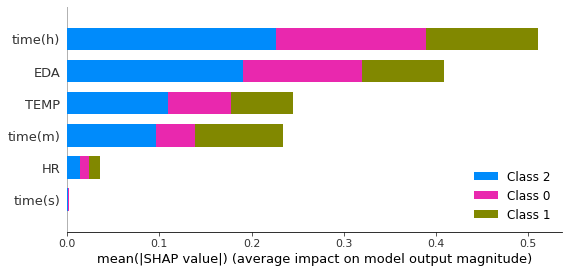

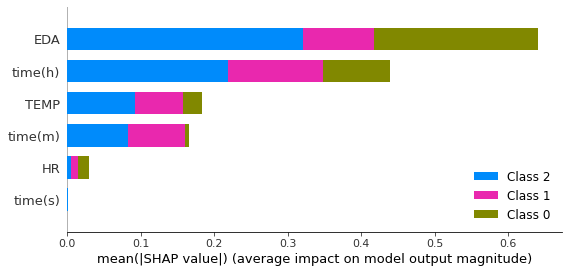

In [32]:
shap.summary_plot(shap_values, X_train, feature_names=features, plot_type="bar")
shap.summary_plot(shap_values_test, X_test, feature_names=features, plot_type="bar")

#### Shap with Xgboost

In [33]:
import xgboost as xgb

dtrain = xgb.DMatrix(X_train, label=y_train)
dval = xgb.DMatrix(X_val, label=y_val)
dtest = xgb.DMatrix(X_test, label=y_test)

In [34]:
fitted_xgb_model = xgb.XGBRegressor(max_depth=7, learning_rate=0.8,\
                    n_jobs=4, objective='reg:squarederror',\
                    n_estimators=50).\
                    fit(X_train, y_train,\
                    eval_set=[(X_train, y_train),(X_val, y_val)],\
                    eval_metric='rmse')

[0]	validation_0-rmse:0.61699	validation_1-rmse:0.77786
[1]	validation_0-rmse:0.54954	validation_1-rmse:0.65750
[2]	validation_0-rmse:0.52079	validation_1-rmse:0.62138
[3]	validation_0-rmse:0.47986	validation_1-rmse:0.57576
[4]	validation_0-rmse:0.45776	validation_1-rmse:0.54966
[5]	validation_0-rmse:0.43525	validation_1-rmse:0.52294
[6]	validation_0-rmse:0.40199	validation_1-rmse:0.48408
[7]	validation_0-rmse:0.37647	validation_1-rmse:0.45288
[8]	validation_0-rmse:0.35490	validation_1-rmse:0.42714
[9]	validation_0-rmse:0.34359	validation_1-rmse:0.41607
[10]	validation_0-rmse:0.33734	validation_1-rmse:0.40912
[11]	validation_0-rmse:0.32414	validation_1-rmse:0.39553
[12]	validation_0-rmse:0.31274	validation_1-rmse:0.38287
[13]	validation_0-rmse:0.30317	validation_1-rmse:0.37092
[14]	validation_0-rmse:0.29456	validation_1-rmse:0.36162
[15]	validation_0-rmse:0.28762	validation_1-rmse:0.35365
[16]	validation_0-rmse:0.28268	validation_1-rmse:0.34820
[17]	validation_0-rmse:0.27674	validation

In [35]:
y_train_xgb_pred = fitted_xgb_model.predict(X_train)
y_test_xgb_pred = fitted_xgb_model.predict(X_test)
RMSE_xgb_train = math.sqrt(\
                    metrics.mean_squared_error(y_train,\
                                               y_train_xgb_pred))
RMSE_xgb_test = math.sqrt(\
                    metrics.mean_squared_error(y_test,
                                               y_test_xgb_pred))
R2_xgb_test = metrics.r2_score(y_test, y_test_xgb_pred)
print('RMSE_train: %.4f\tRMSE_test: %.4f\tr2: %.4f' %\
                    (RMSE_xgb_train, RMSE_xgb_test, R2_xgb_test))

RMSE_train: 0.1894	RMSE_test: 0.2348	r2: 0.9121


In [ ]:
## How often feature appears in the tree (weight)
sns.set()
fig, ax = plt.subplots(figsize=(12, 8))
xgb.plot_importance(fitted_xgb_model, max_num_features=12, feature_names=features, ax=ax,\
                    importance_type="weight")
plt.show()

###### SHAP

In [37]:
background = X_train[np.random.choice(X_train.shape[0], 100, replace=False)]

shap_xgb_explainer = shap.TreeExplainer(fitted_xgb_model, background)

In [38]:
shap_xgb_values_train = shap_xgb_explainer.shap_values(X_train[0:5000])
print(shap_xgb_values_train.shape)
shap_xgb_values_test = shap_xgb_explainer.shap_values(X_test[:5000])
print(shap_xgb_values_test.shape)

 93%|=================== | 4669/5000 [00:13<00:00]       

(5000, 6)


 94%|=================== | 4709/5000 [00:13<00:00]       

(5000, 6)


In [39]:
#shap_nn_explainer = shap.GradientExplainer(pre_model, background.astype(float).values)
shap_nn_explainer = shap.KernelExplainer(pre_model, background)

In [40]:
shap_nn_values_test = shap_nn_explainer.shap_values(X_test[random_indices2])
print(type(shap_nn_values_test))
print(shap_nn_values_test[0].shape)


<class 'list'>
(5000, 6)


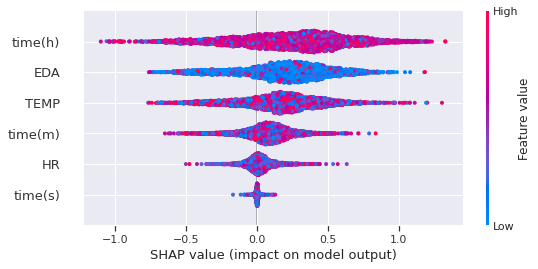

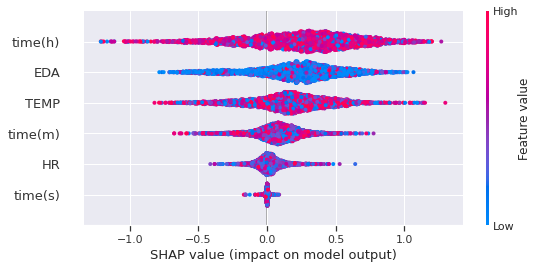

In [41]:
shap.summary_plot(shap_xgb_values_train, X_train[random_indices], feature_names=features, plot_type="dot")
shap.summary_plot(shap_xgb_values_test, X_test[random_indices2],feature_names=features, plot_type="dot")

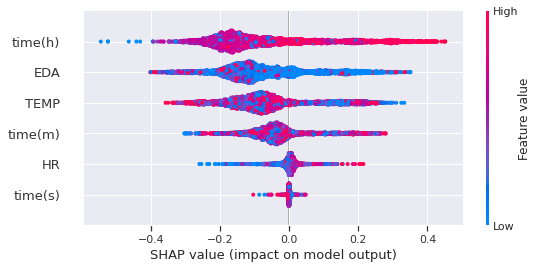

In [42]:
shap.summary_plot(shap_nn_values_test[0], X_test[random_indices2],feature_names=features, plot_type="dot")

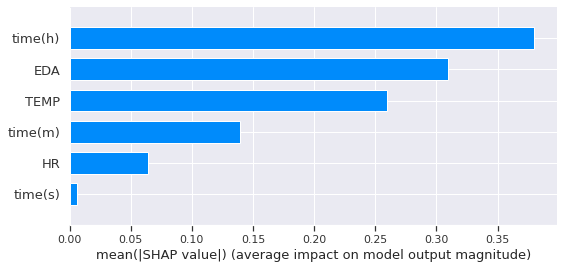

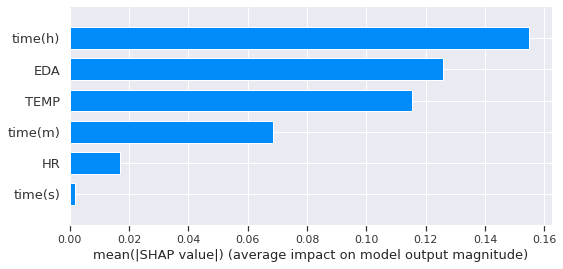

In [43]:
shap.summary_plot(shap_xgb_values_test, X_test[random_indices2],feature_names=features, plot_type="bar")
shap.summary_plot(shap_nn_values_test[0], X_test[random_indices2],feature_names=features, plot_type="bar")

###### Top Features:

In [ ]:
from scipy import stats
import seaborn as sns

corrs = stats.spearmanr(df3).correlation
mask = np.zeros_like(corrs)
mask[np.triu_indices_from(mask)] = True
ax = sns.heatmap(
    corrs,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    xticklabels=df3.columns,
    yticklabels=df3.columns,
    mask=mask,
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
plt.show()

#### Lime Explainer

#!pip install lime

In [ ]:
import lime
from lime.lime_tabular import LimeTabularExplainer

lime_explainer = lime.lime_tabular.LimeTabularExplainer(X_train,\
                        feature_names=features, class_names=['No Stress.', 'Stress', 'High Stress'])

In [ ]:
lime_explainer.explain_instance(X_train[0],\
                                    pre_model.predict).\
                                show_in_notebook(predict_proba=True)

In [ ]:
lime_explainer.explain_instance(X_train[1],\
                                    pre_model.predict).\
                                show_in_notebook(predict_proba=True)

In [ ]:
lime_explainer.explain_instance(X_train[2],\
                                    pre_model.predict).\
                                show_in_notebook(predict_proba=True)

In [ ]:
lime_explainer.explain_instance(X_test[0],\
                                    pre_model.predict).\
                                show_in_notebook(predict_proba=True)

In [ ]:
lime_explainer.explain_instance(X_test[1],\
                                    pre_model.predict).\
                                show_in_notebook(predict_proba=True)

In [ ]:
lime_explainer.explain_instance(X_test[2],\
                                    pre_model.predict).\
                                show_in_notebook(predict_proba=True)

### Other Classifiers -> Random Forest, Logistic regression

#### Random Forest

In [13]:
X = df3.drop("label", axis = 1).values
y = df3['label'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

under_sample = RandomUnderSampler()
X_train, y_train = under_sample.fit_resample(X_train, y_train)

In [14]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

## Feature Scaling
sc = RobustScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [15]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, r2_score, mean_squared_error

# Train a random forest classifier on the training data
classifier = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)
classifier.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=0)

In [16]:
# Evaluate the model on the testing data
y_pred = classifier.predict(X_test)
#y_true_pred = np.argmax(y_preds, axis=1)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

print('Precision:', precision_score(y_test, y_pred, average='weighted'))
print('Recall:', recall_score(y_test, y_pred, average='weighted'))
print('F1-score:', f1_score(y_test, y_pred, average='weighted'))

# Evaluate the model performance using R-squared and RMSE metrics
print('R-squared score for id prediction:', r2_score(y_test, y_pred))
print('RMSE for id prediction:', mean_squared_error(y_test, y_pred, squared=False))

Accuracy: 0.9998656546686581
Precision: 0.9998657227646569
Recall: 0.9998656546686581
F1-score: 0.9998656659781131
R-squared score for id prediction: 0.9993325457058388
RMSE for id prediction: 0.020456537400803658


In [17]:
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

[[2. 2.]
 [0. 0.]
 [0. 0.]
 ...
 [1. 1.]
 [2. 2.]
 [2. 2.]]


In [18]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred )
print(cm)
accuracy_score(y_test, y_pred )

[[ 541276       0       4]
 [      0  192920       0]
 [    266     113 2116283]]


0.9998656546686581

<AxesSubplot:>

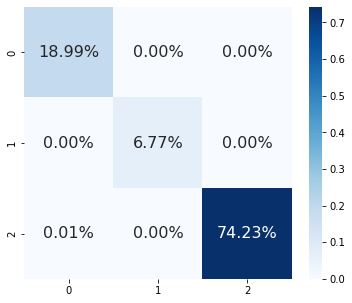

In [19]:
from sklearn.metrics import confusion_matrix

import seaborn as sns
import matplotlib.pyplot as plt

cf_matrix = confusion_matrix(y_test,y_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,\
            fmt='.2%', cmap='Blues', annot_kws={'size':16})

#### Logistic Regression

In [20]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, r2_score, mean_squared_error

from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(random_state = 0)
classifier.fit(X_train, y_train)

## flattened array
y_pred = classifier.predict(X_test)
#y_true_pred

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted', zero_division=1)
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Evaluate the model performance using R-squared and RMSE metrics
r2 = r2_score(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)

print("Accuracy:", accuracy)
print('Precision:', precision)
print('Recall:', recall)
print('F1-score:', f1)
print('R-squared score:', r2)
print('RMSE:', rmse)

Accuracy: 0.5233522352186812
Precision: 0.6943072506544576
Recall: 0.5233522352186812
F1-score: 0.5794498056829076
R-squared score: -0.9030022682121159
RMSE: 1.0922976805781532


In [21]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred )
print(cm)
accuracy_score(y_test, y_pred )

[[ 237397  154969  148914]
 [  74683   63129   55108]
 [ 531935  393248 1191479]]


0.5233522352186812

<AxesSubplot:>

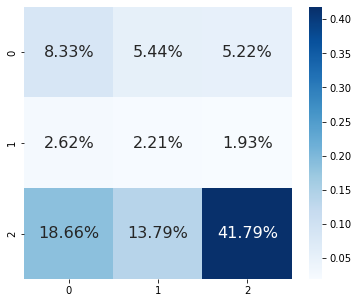

In [22]:
from sklearn.metrics import confusion_matrix

import seaborn as sns
import matplotlib.pyplot as plt

cf_matrix = confusion_matrix(y_test,y_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,\
            fmt='.2%', cmap='Blues', annot_kws={'size':16})

#### SVM

In [ ]:
from sklearn.svm import SVC
## it takes too long without a return in kernel 'rbf'
classifier = SVC(kernel = 'rbf', random_state = 42)
classifier.fit(X_train, y_train)

In [ ]:
y_pred = classifier.predict(X_test)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

## Students Stress Data

## Importing and Preprocessing

In [28]:
## Data load and process
S1 = pd.read_excel("/home/up2145253/StudentsStress/S1.xlsx")
S2 = pd.read_excel("/home/up2145253/StudentsStress/S2.xlsx")
S3 = pd.read_excel("/home/up2145253/StudentsStress/S3.xlsx")
S4 = pd.read_excel("/home/up2145253/StudentsStress/S4.xlsx")
S5 = pd.read_excel("/home/up2145253/StudentsStress/S5.xlsx")
S6 = pd.read_excel("/home/up2145253/StudentsStress/S6.xlsx")
S7 = pd.read_excel("/home/up2145253/StudentsStress/S7.xlsx")
S8 = pd.read_excel("/home/up2145253/StudentsStress/S8.xlsx")
S9 = pd.read_excel("/home/up2145253/StudentsStress/S9.xlsx")
S10 = pd.read_excel("/home/up2145253/StudentsStress/S10.xlsx")

In [29]:
S1 = pd.DataFrame(S1)
S2 = pd.DataFrame(S2)
S3 = pd.DataFrame(S3)
S4 = pd.DataFrame(S4)
S5 = pd.DataFrame(S5)
S6 = pd.DataFrame(S6)
S7 = pd.DataFrame(S7)
S8 = pd.DataFrame(S8)
S9 = pd.DataFrame(S9)
S10 = pd.DataFrame(S10)

In [30]:
S1.info()
S2.info()
S3.info()
S4.info()
S5.info()
S6.info()
S7.info()
S8.info()
S9.info()
S10.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 308868 entries, 0 to 308867
Data columns (total 12 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   X          308868 non-null  int64  
 1   Y          308868 non-null  int64  
 2   Z          308868 non-null  int64  
 3   ERD        182835 non-null  float64
 4   HR         45683 non-null   float64
 5   TEMP       182840 non-null  float64
 6   Time(s)    182836 non-null  float64
 7   Time(m)    182836 non-null  float64
 8   Time(h)    182836 non-null  float64
 9   id         308868 non-null  object 
 10  Exam_type  308868 non-null  object 
 11  Score      308868 non-null  int64  
dtypes: float64(6), int64(4), object(2)
memory usage: 28.3+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 248909 entries, 0 to 248908
Data columns (total 12 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   X          240852 non-null  float64
 1   Y          24

In [31]:
Step_C1 = S1.append(S2)
Step_C2 = S3.append(S4)
Step_C3 = S5.append(S6)
Step_C4 = S7.append(S8)
Step_C5 = S9.append(S10)

In [32]:
Step2_C1 = Step_C1.append(Step_C2)
Step2_C2 = Step_C3.append(Step_C4)
Step2_C3 = Step2_C1.append(Step2_C2)
Step2_C4 = Step2_C3.append(Step_C5)

In [33]:
Step2_C4.info()
StudentsData = Step2_C4

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2899570 entries, 0 to 250190
Data columns (total 12 columns):
 #   Column     Dtype  
---  ------     -----  
 0   X          float64
 1   Y          float64
 2   Z          float64
 3   ERD        float64
 4   HR         float64
 5   TEMP       float64
 6   Time(s)    float64
 7   Time(m)    float64
 8   Time(h)    float64
 9   id         object 
 10  Exam_type  object 
 11  Score      int64  
dtypes: float64(9), int64(1), object(2)
memory usage: 287.6+ MB


In [34]:
StudentsData.head()

,X,Y,Z,ERD,HR,TEMP,Time(s),Time(m),Time(h),id,Exam_type,Score
0,-3.0,-62.0,12.0,0.002563,84.00,22.51,0.241551,0.004026,0.000067,s1,midterm,78
1,-3.0,-61.0,12.0,0.019221,85.00,22.51,0.362327,0.006039,0.000101,s1,midterm,78
2,-2.0,-62.0,12.0,0.021784,86.00,22.51,0.483103,0.008052,0.000134,s1,midterm,78
3,-3.0,-63.0,12.0,0.023065,86.75,22.51,0.603878,0.010065,0.000168,s1,midterm,78
4,-2.0,-61.0,12.0,0.024347,87.40,22.51,0.724654,0.012078,0.000201,s1,midterm,78


In [35]:
StudentsData.drop(['X','Y','Exam_type','id'], axis=1, inplace=True)
StudentsData.drop(StudentsData.columns[0], axis=1, inplace=True)

In [36]:
df4 = StudentsData.copy()

df4['HR'].fillna(df4['HR'].mean(), inplace=True)

In [37]:
df4

,ERD,HR,TEMP,Time(s),Time(m),Time(h),Score
0,0.002563,84.000000,22.51,0.241551,0.004026,0.000067,78
1,0.019221,85.000000,22.51,0.362327,0.006039,0.000101,78
2,0.021784,86.000000,22.51,0.483103,0.008052,0.000134,78
3,0.023065,86.750000,22.51,0.603878,0.010065,0.000168,78
4,0.024347,87.400000,22.51,0.724654,0.012078,0.000201,78
...,...,...,...,...,...,...,...
250186,NaN,104.040514,NaN,NaN,NaN,NaN,116
250187,NaN,104.040514,NaN,NaN,NaN,NaN,116
250188,NaN,104.040514,NaN,NaN,NaN,NaN,116
250189,NaN,104.040514,NaN,NaN,NaN,NaN,116


In [38]:
df4.dropna(axis = 0, inplace = True)

In [39]:
## DATA SORTING
num_duplicated_rows = df4.duplicated().sum()

num_duplicated_rows

num_duplicated_rows/len(df4) * 100

0.0

In [40]:
#df4.drop_duplicates(inplace=True)

In [41]:
a = np.array(df4["Score"].values.tolist())
df4["Score"] = np.where(a >= 100, a/2, a).tolist()

In [42]:
#df4
#df4 = df4.tail(-1)

df4.rename(columns={'ERD': 'EDA'}, inplace=True)

###### Following this system:
https://www.theinsideword.ac.nz/files/2017/06/Screen-Shot-2017-07-04-at-9.07.36-AM-298yt33.png

In [43]:
conditions = [
    (df4['Score'] >=75),
    (df4['Score'] >= 50) & (df4['Score'] < 75),
    (df4['Score'] < 50)
    ]

## Labeling performance 2 as Great (B and above), 1 as pass (between B and C- grades), 0 as Fail (D+ and Below).
values = [ 2, 1, 0]

df4['Performance'] = np.select(conditions, values)

df4

,EDA,HR,TEMP,Time(s),Time(m),Time(h),Score,Performance
0,0.002563,84.000000,22.51,0.241551,0.004026,0.000067,78.0,2
1,0.019221,85.000000,22.51,0.362327,0.006039,0.000101,78.0,2
2,0.021784,86.000000,22.51,0.483103,0.008052,0.000134,78.0,2
3,0.023065,86.750000,22.51,0.603878,0.010065,0.000168,78.0,2
4,0.024347,87.400000,22.51,0.724654,0.012078,0.000201,78.0,2
...,...,...,...,...,...,...,...,...
244562,0.021781,104.040514,22.51,10799.063841,179.984397,2.999740,58.0,1
244563,0.020500,104.040514,22.53,10799.180861,179.986348,2.999772,58.0,1
244564,0.021781,104.040514,22.53,10799.297881,179.988298,2.999805,58.0,1
244565,0.021781,104.040514,22.53,10799.414901,179.990248,2.999837,58.0,1


In [44]:
#df4['Performance'] = df4['Performance'].replace(["Great", "Good", "Bad"], [2, 1, 0])

In [45]:
df4['Performance'].value_counts()

2    988389
1    542198
0     92974
Name: Performance, dtype: int64

In [46]:
df4

,EDA,HR,TEMP,Time(s),Time(m),Time(h),Score,Performance
0,0.002563,84.000000,22.51,0.241551,0.004026,0.000067,78.0,2
1,0.019221,85.000000,22.51,0.362327,0.006039,0.000101,78.0,2
2,0.021784,86.000000,22.51,0.483103,0.008052,0.000134,78.0,2
3,0.023065,86.750000,22.51,0.603878,0.010065,0.000168,78.0,2
4,0.024347,87.400000,22.51,0.724654,0.012078,0.000201,78.0,2
...,...,...,...,...,...,...,...,...
244562,0.021781,104.040514,22.51,10799.063841,179.984397,2.999740,58.0,1
244563,0.020500,104.040514,22.53,10799.180861,179.986348,2.999772,58.0,1
244564,0.021781,104.040514,22.53,10799.297881,179.988298,2.999805,58.0,1
244565,0.021781,104.040514,22.53,10799.414901,179.990248,2.999837,58.0,1


### Predicting Stress

In [47]:
new_X = df4.drop(["Score", "Performance"], axis = 1).values

print(new_X.shape)

(1623561, 6)


In [48]:
new_X

array([[2.56300000e-03, 8.40000000e+01, 2.25100000e+01, 2.41551296e-01,
        4.02585494e-03, 6.70975823e-05],
       [1.92210000e-02, 8.50000000e+01, 2.25100000e+01, 3.62326944e-01,
        6.03878240e-03, 1.00646373e-04],
       [2.17840000e-02, 8.60000000e+01, 2.25100000e+01, 4.83102592e-01,
        8.05170987e-03, 1.34195165e-04],
       ...,
       [2.17810000e-02, 1.04040514e+02, 2.25300000e+01, 1.07992979e+04,
        1.79988298e+02, 2.99980497e+00],
       [2.17810000e-02, 1.04040514e+02, 2.25300000e+01, 1.07994149e+04,
        1.79990248e+02, 2.99983747e+00],
       [2.05000000e-02, 1.04040514e+02, 2.25300000e+01, 1.07995319e+04,
        1.79992199e+02, 2.99986998e+00]])

In [49]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

## Feature Scaling
sc = RobustScaler()
X_new = sc.fit_transform(new_X)

In [50]:
# Predict stress labels for dataset2
predictions = pre_model.predict(X_new)

## flattened array
y_true_pred_students = np.argmax(predictions, axis=1)
y_true_pred_students

# Save the predicted labels to dataset2 or do further analysis
#df4['Predicted_Stress_Label'] = y_true_pred_students


array([2, 2, 2, ..., 2, 2, 2])

In [51]:
y_true_pred_students

array([2, 2, 2, ..., 2, 2, 2])

In [52]:
df4['Predicted_Stress_Label'] = y_true_pred_students

In [53]:
#df4.rename(columns={'ERD': 'EDA'}, inplace=True)

In [54]:
df4

,EDA,HR,TEMP,Time(s),Time(m),Time(h),Score,Performance,Predicted_Stress_Label
0,0.002563,84.000000,22.51,0.241551,0.004026,0.000067,78.0,2,2
1,0.019221,85.000000,22.51,0.362327,0.006039,0.000101,78.0,2,2
2,0.021784,86.000000,22.51,0.483103,0.008052,0.000134,78.0,2,2
3,0.023065,86.750000,22.51,0.603878,0.010065,0.000168,78.0,2,2
4,0.024347,87.400000,22.51,0.724654,0.012078,0.000201,78.0,2,2
...,...,...,...,...,...,...,...,...,...
244562,0.021781,104.040514,22.51,10799.063841,179.984397,2.999740,58.0,1,2
244563,0.020500,104.040514,22.53,10799.180861,179.986348,2.999772,58.0,1,2
244564,0.021781,104.040514,22.53,10799.297881,179.988298,2.999805,58.0,1,2
244565,0.021781,104.040514,22.53,10799.414901,179.990248,2.999837,58.0,1,2


In [55]:
df4['Predicted_Stress_Label'].value_counts()

2    1181225
0     248419
1     193917
Name: Predicted_Stress_Label, dtype: int64

In [54]:
#df4.to_csv('dataset2_with_predictions.csv', index=False)

In [55]:
df_analysis = df4.copy()

In [56]:
df_analysis.drop(['EDA','HR','TEMP', 'Time(s)','Time(m)', 'Time(h)'], axis=1, inplace=True)

In [57]:
df_analysis.groupby(['Score', 'Performance']).mean()

,,Predicted_Stress_Label
Score,Performance,
33.0,0,1.721112
39.0,0,1.786766
55.0,1,1.183123
58.0,1,0.969400
63.0,1,1.238244
64.0,1,1.817483
67.0,1,1.390833
71.0,1,1.435079
74.5,1,1.157452


In [58]:
#df_analysis.drop(['Score'], axis=1, inplace=True)
df_analysis.groupby(['Performance']).mean()

,Score,Predicted_Stress_Label
Performance,,
0,36.208639,1.756222
1,63.643141,1.373780
2,85.523173,1.207945


### Visualizing

In [ ]:
df_analysis.groupby(['Performance', 'Predicted_Stress_Label']).mean()

In [ ]:
df_analysis.groupby(['Predicted_Stress_Label']).mean()

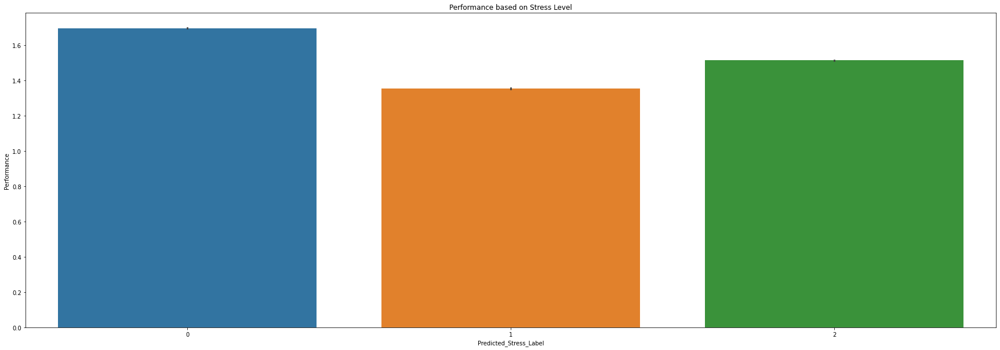

In [85]:
# Count the number of occurrences of each label for each ID
#Stress_duration = df.groupby(['id', 'time(m)']).size().unstack()
fig, axs = plt.subplots(figsize=(30,10))
sns.barplot(x="Predicted_Stress_Label", y="Performance", data=df4, ax=axs)

# Set the axis labels and title
plt.xlabel('Predicted_Stress_Label')
plt.ylabel('Performance')
plt.title('Performance based on Stress Level')

# Display the plot
plt.show()

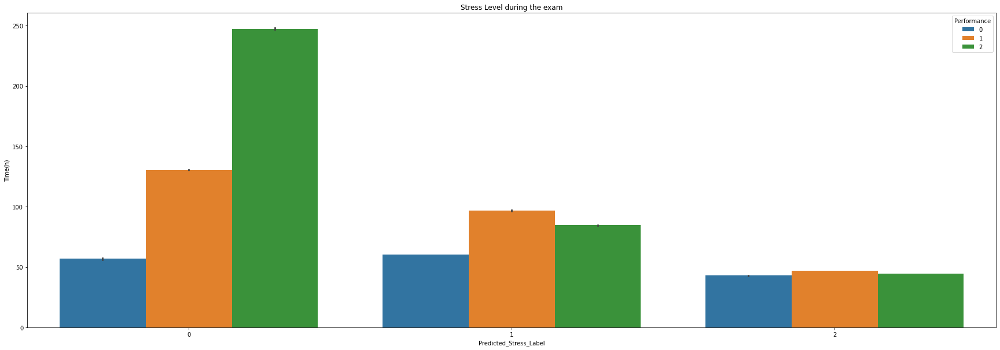

In [86]:
# Count the number of occurrences of each label for each ID
#Stress_duration = df.groupby(['id', 'time(m)']).size().unstack()
fig, axs = plt.subplots(figsize=(30,10))
sns.barplot(x="Predicted_Stress_Label", y="Time(m)", hue="Performance", data=df4, ax=axs)

# Set the axis labels and title
plt.xlabel('Predicted_Stress_Label')
plt.ylabel('Time(h)')
plt.title('Stress Level during the exam')

# Display the plot
plt.show()

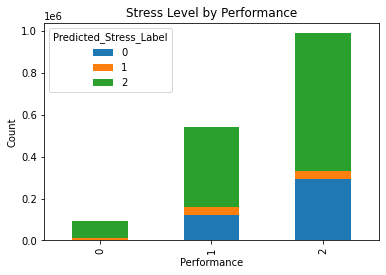

In [88]:
# Count the number of occurrences of each label for each ID
label_counts = df4.groupby(['Performance', 'Predicted_Stress_Label']).size().unstack()

# Create a stacked bar chart
label_counts.plot(kind='bar', stacked=True)

# Set the axis labels and title
plt.xlabel('Performance')
plt.ylabel('Count')
plt.title('Stress Level by Performance')

# Display the plot
plt.show()

In [ ]:
# Count the number of occurrences of each label for each ID
#Stress_duration = df.groupby(['id', 'time(m)']).size().unstack()
fig, axs = plt.subplots(figsize=(30,10))
sns.lineplot(x="Predicted_Stress_Label", y="Time(h)", hue="Performance", data=df4, ax=axs)

# Set the axis labels and title
plt.xlabel('Predicted_Stress_Label')
plt.ylabel('Time(h)')
plt.title('Stress Level during the exam')

# Display the plot
plt.show()

### Modelling: Using Fine-Tuning for performance

##### updating last layer

In [93]:
from tensorflow.keras.models import load_model

# Load a pre-trained model
pre_model = load_model('Stress.h5')  # Load your pre-trained model

# Modify the model for transfer learning
#model = Sequential()
#for layer in pretrained_model.layers[:-1]:
#    model.add(layer)
#model.add(Dense(3, activation='softmax'))  # Output layer for binary classification

# Freeze the pre-trained layers
pre_model.trainable = True
for layer in pre_model.layers[:-1]:
    layer.trainable = False

In [56]:
df4

,EDA,HR,TEMP,Time(s),Time(m),Time(h),Score,Performance,Predicted_Stress_Label
0,0.002563,84.000000,22.51,0.241551,0.004026,0.000067,78.0,2,2
1,0.019221,85.000000,22.51,0.362327,0.006039,0.000101,78.0,2,2
2,0.021784,86.000000,22.51,0.483103,0.008052,0.000134,78.0,2,2
3,0.023065,86.750000,22.51,0.603878,0.010065,0.000168,78.0,2,2
4,0.024347,87.400000,22.51,0.724654,0.012078,0.000201,78.0,2,2
...,...,...,...,...,...,...,...,...,...
244562,0.021781,104.040514,22.51,10799.063841,179.984397,2.999740,58.0,1,2
244563,0.020500,104.040514,22.53,10799.180861,179.986348,2.999772,58.0,1,2
244564,0.021781,104.040514,22.53,10799.297881,179.988298,2.999805,58.0,1,2
244565,0.021781,104.040514,22.53,10799.414901,179.990248,2.999837,58.0,1,2


In [57]:
newX = df4.drop(["Score", "Performance", "Predicted_Stress_Label"], axis = 1).values
newy = df4['Performance'].values

In [58]:
## Not enough Samples for 0, 1 in labels
over_sample = SMOTETomek(random_state=42)
#newX, newy = over_sample.fit_resample(X, y)

In [59]:
X_train, X_temp, y_train, y_temp = train_test_split(newX, newy, test_size=0.1, random_state=42)

X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [60]:

X_train, y_train = over_sample.fit_resample(X_train, y_train)
#X_val, y_val = over_sample.fit_resample(X_val, y_val)

In [61]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

## Feature Scaling
sc = RobustScaler()
X_train = sc.fit_transform(X_train)
X_val = sc.transform(X_val)
X_test = sc.transform(X_test)

In [62]:
# Train the model
pre_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

history = pre_model.fit(X_train, y_train, validation_data=(X_val,y_val), epochs= 10, batch_size=1000, callbacks=[early_stop])

Epoch 1/10
2631/2631 [==============================] - 12s 5ms/step - loss: 1.5181 - accuracy: 0.7710 - val_loss: 0.5151 - val_accuracy: 0.7967
Epoch 2/10
2631/2631 [==============================] - 12s 4ms/step - loss: 0.3667 - accuracy: 0.8620 - val_loss: 0.4156 - val_accuracy: 0.8247
Epoch 3/10
2631/2631 [==============================] - 12s 4ms/step - loss: 0.3018 - accuracy: 0.8846 - val_loss: 0.3497 - val_accuracy: 0.8579
Epoch 4/10
2631/2631 [==============================] - 12s 4ms/step - loss: 0.2686 - accuracy: 0.8964 - val_loss: 0.3149 - val_accuracy: 0.8637
Epoch 5/10
2631/2631 [==============================] - 12s 5ms/step - loss: 0.2449 - accuracy: 0.9052 - val_loss: 0.3013 - val_accuracy: 0.8754
Epoch 6/10
2631/2631 [==============================] - 12s 4ms/step - loss: 0.2294 - accuracy: 0.9109 - val_loss: 0.2777 - val_accuracy: 0.8833
Epoch 7/10
2631/2631 [==============================] - 12s 5ms/step - loss: 0.2175 - accuracy: 0.9150 - val_loss: 0.2586 - val_ac

<AxesSubplot:>

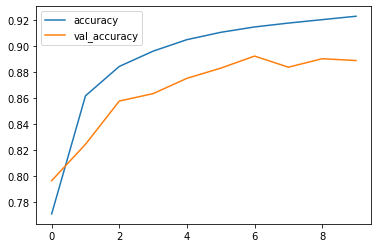

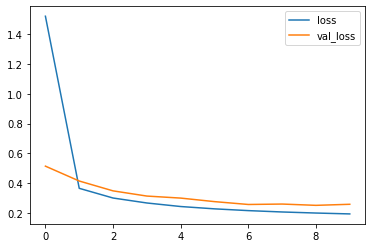

In [63]:
metrics_df = pd.DataFrame(history.history)
metrics_df

# Accuracy
metrics_df[['accuracy','val_accuracy']].plot()

# Loss
metrics_df[['loss','val_loss']].plot()

In [64]:
y_preds = pre_model.predict(X_test)
y_preds

## flattened array
y_true_pred = np.argmax(y_preds, axis=1)
y_true_pred

array([2, 2, 1, ..., 1, 2, 1])

In [65]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_true_pred)
print(cm)
#accuracy_score(y_test, y_true_pred)

[[ 4461    33    48]
 [ 1101 24284  1840]
 [ 2630  3326 43456]]


<AxesSubplot:>

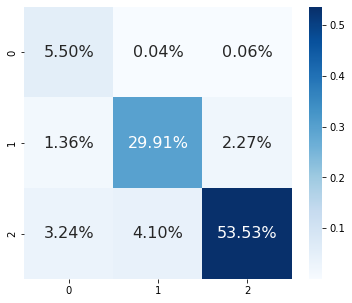

In [66]:
import seaborn as sns
import matplotlib.pyplot as plt

cf_matrix = confusion_matrix(y_test, y_true_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,\
            fmt='.2%', cmap='Blues', annot_kws={'size':16})

In [63]:
#loss, accuracy = pre_model.evaluate(X_val, y_train)
#print(f'Model Accuracy: {accuracy}')

In [64]:
loss, accuracy = pre_model.evaluate(X_val, y_val)
print(f'Validation Accuracy: {accuracy}')

2537/2537 [==============================] - 3s 1ms/step - loss: 0.2314 - accuracy: 0.9080
Validation Accuracy: 0.9080292582511902


In [65]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, r2_score, mean_squared_error
#y_true_pred = np.argmax(y_preds, axis=1)

accuracy = accuracy_score(y_test, y_true_pred)
print(f"Accuracy: {accuracy}")

print('Precision:', precision_score(y_test, y_true_pred, average='weighted'))
print('Recall:', recall_score(y_test, y_true_pred, average='weighted'))
print('F1-score:', f1_score(y_test, y_true_pred, average='weighted'))

# Evaluate the model performance using R-squared and RMSE metrics
print('R-squared score for performance prediction:', r2_score(y_test, y_true_pred))
print('RMSE for performance prediction:', mean_squared_error(y_test, y_true_pred, squared=False))

Accuracy: 0.9082151788023997
Precision: 0.9162964599477289
Recall: 0.9082151788023997
F1-score: 0.9095993614592809
R-squared score for performance prediction: 0.6049812001814746
RMSE for performance prediction: 0.37664220138070026


##### Different Learning Rates

In [108]:
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import Adam

# Define different learning rates for different layers
learning_rates = {
    'conv2d_layer': 0.001,
    'dense_layer': 0.01,
    'output_layer': 0.001
}

layer_learning_rates = {}

# Load a pre-trained model
pre_model = load_model('Stress.h5')  # Load your pre-trained model

optimizer = Adam(learning_rate=layer_learning_rates)
    
for layer in pre_model.layers:
    if layer.name.startswith('conv2d'):
        layer_learning_rates[layer.name] = learning_rates['conv2d_layer']
    elif layer.name.startswith('dense'):
        layer_learning_rates[layer.name] = learning_rates['dense_layer']
    else:
        layer_learning_rates[layer.name] = learning_rates['output_layer']

optimizer = Adam(learning_rate=layer_learning_rates)

In [109]:
# Create a dictionary to store layer-wise learning rates
layer_learning_rates = {}
for layer in pre_model.layers:
    if layer.name.startswith('conv2d'):
        layer_learning_rates[layer.name] = learning_rates['conv2d_layer']
    elif layer.name.startswith('dense'):
        layer_learning_rates[layer.name] = learning_rates['dense_layer']
    else:
        layer_learning_rates[layer.name] = learning_rates['output_layer']

In [110]:
# Train the model
pre_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

pre_model.fit(X_train, y_train, validation_data=(X_val,y_val), epochs= 10, batch_size=1000, callbacks=[early_stop])

Epoch 1/10
2669/2669 [==============================] - 13s 5ms/step - loss: 2.7362 - accuracy: 0.7402 - val_loss: 0.7755 - val_accuracy: 0.7827
Epoch 2/10
2669/2669 [==============================] - 12s 5ms/step - loss: 0.6157 - accuracy: 0.8269 - val_loss: 0.8494 - val_accuracy: 0.7549
Epoch 3/10
2669/2669 [==============================] - 12s 5ms/step - loss: 0.4809 - accuracy: 0.8490 - val_loss: 0.5186 - val_accuracy: 0.8347
Epoch 4/10
2669/2669 [==============================] - 12s 5ms/step - loss: 0.4193 - accuracy: 0.8598 - val_loss: 0.3952 - val_accuracy: 0.8547
Epoch 5/10
2669/2669 [==============================] - 12s 5ms/step - loss: 0.3800 - accuracy: 0.8680 - val_loss: 0.3984 - val_accuracy: 0.8647
Epoch 6/10
2669/2669 [==============================] - 12s 5ms/step - loss: 0.3518 - accuracy: 0.8733 - val_loss: 0.4186 - val_accuracy: 0.8359
Epoch 7/10
2669/2669 [==============================] - 12s 5ms/step - loss: 0.3351 - accuracy: 0.8770 - val_loss: 0.3927 - val_ac

<AxesSubplot:>

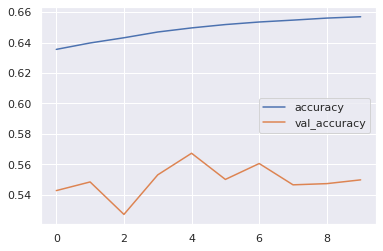

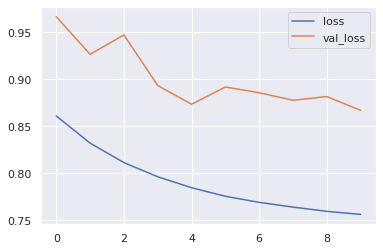

In [111]:
metrics_df = pd.DataFrame(history.history)
metrics_df

# Accuracy
metrics_df[['accuracy','val_accuracy']].plot()

# Loss
metrics_df[['loss','val_loss']].plot()

In [112]:
y_preds = pre_model.predict(X_test)
y_preds

## flattened array
y_true_pred = np.argmax(y_preds, axis=1)
y_true_pred

array([2, 2, 1, ..., 2, 2, 1])

In [ ]:
loss, accuracy = pre_model.evaluate(X_val, y_train)
print(f'Model Accuracy: {accuracy}')

In [ ]:
loss, accuracy = pre_model.evaluate(X_val, y_val)
print(f'Validation Accuracy: {accuracy}')

In [113]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_true_pred)
print(cm)
#accuracy_score(y_test, y_true_pred)

[[ 4368    33   141]
 [ 1812 22123  3290]
 [ 2871  2807 43734]]


<AxesSubplot:>

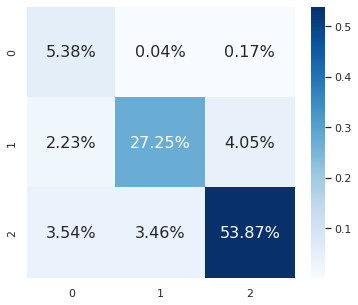

In [114]:
import seaborn as sns
import matplotlib.pyplot as plt

cf_matrix = confusion_matrix(y_test, y_true_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,\
            fmt='.2%', cmap='Blues', annot_kws={'size':16})

In [115]:
#y_true_pred = np.argmax(y_preds, axis=1)

accuracy = accuracy_score(y_test, y_true_pred)
print(f"Accuracy: {accuracy}")

print('Precision:', precision_score(y_test, y_true_pred, average='weighted'))
print('Recall:', recall_score(y_test, y_true_pred, average='weighted'))
print('F1-score:', f1_score(y_test, y_true_pred, average='weighted'))

# Evaluate the model performance using R-squared and RMSE metrics
print('R-squared score for id prediction:', r2_score(y_test, y_true_pred))
print('RMSE for id prediction:', mean_squared_error(y_test, y_true_pred, squared=False))

Accuracy: 0.8650636248290814
Precision: 0.8886185053619444
Recall: 0.8650636248290814
F1-score: 0.871561443560778
R-squared score for id prediction: 0.3143082833994163
RMSE for id prediction: 0.4962317506038338


##### Gradual Freezing

In [67]:
# Gradually unfreeze layers and train the entire model


for layer in pre_model.layers[:-4]:
    layer.trainable = False

pre_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

pre_model.fit(X_train, y_train, validation_data=(X_val,y_val), epochs= 10, batch_size=1000, callbacks=[early_stop])

# Unfreeze more layers and continue training
for layer in pre_model.layers[:-6]:
    layer.trainable = True

pre_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

pre_model.fit(X_train, y_train, validation_data=(X_val,y_val), epochs= 10, batch_size=1000, callbacks=[early_stop])

Epoch 1/10
2631/2631 [==============================] - 12s 5ms/step - loss: 0.1903 - accuracy: 0.9250 - val_loss: 0.2681 - val_accuracy: 0.8857
Epoch 2/10
2631/2631 [==============================] - 12s 5ms/step - loss: 0.1856 - accuracy: 0.9268 - val_loss: 0.2293 - val_accuracy: 0.9034
Epoch 3/10
2631/2631 [==============================] - 12s 4ms/step - loss: 0.1822 - accuracy: 0.9280 - val_loss: 0.2232 - val_accuracy: 0.9060
Epoch 4/10
2631/2631 [==============================] - 12s 4ms/step - loss: 0.1792 - accuracy: 0.9291 - val_loss: 0.2216 - val_accuracy: 0.9011
Epoch 5/10
2631/2631 [==============================] - 12s 4ms/step - loss: 0.1750 - accuracy: 0.9307 - val_loss: 0.2130 - val_accuracy: 0.9110
Epoch 6/10
2631/2631 [==============================] - 12s 4ms/step - loss: 0.1733 - accuracy: 0.9312 - val_loss: 0.2270 - val_accuracy: 0.9016
Epoch 7/10
2631/2631 [==============================] - 12s 5ms/step - loss: 0.1706 - accuracy: 0.9323 - val_loss: 0.2044 - val_ac

<AxesSubplot:>

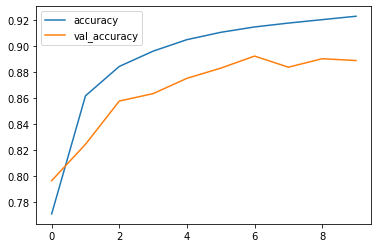

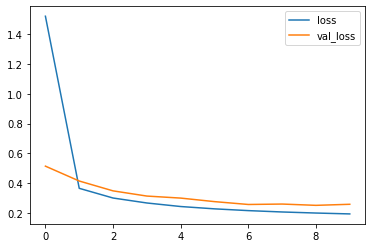

In [68]:
metrics_df = pd.DataFrame(history.history)
metrics_df

# Accuracy
metrics_df[['accuracy','val_accuracy']].plot()

# Loss
metrics_df[['loss','val_loss']].plot()

In [69]:
y_preds = pre_model.predict(X_test)
y_preds

## flattened array
y_true_pred = np.argmax(y_preds, axis=1)
y_true_pred

array([2, 2, 1, ..., 1, 2, 1])

In [70]:
#loss, accuracy = pre_model.evaluate(X_val, y_train)
#print(f'Model Accuracy: {accuracy}')

In [71]:
loss, accuracy = pre_model.evaluate(X_val, y_val)
print(f'Validation Accuracy: {accuracy}')

2537/2537 [==============================] - 4s 2ms/step - loss: 0.1864 - accuracy: 0.9214
Validation Accuracy: 0.9213826656341553


In [72]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_true_pred)
print(cm)
#accuracy_score(y_test, y_true_pred)

[[ 4441    31    70]
 [  481 24976  1768]
 [ 1527  2571 45314]]


<AxesSubplot:>

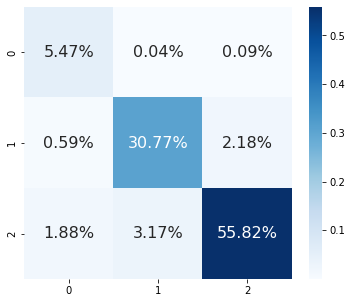

In [73]:
import seaborn as sns
import matplotlib.pyplot as plt

cf_matrix = confusion_matrix(y_test, y_true_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,\
            fmt='.2%', cmap='Blues', annot_kws={'size':16})

In [ ]:
#y_true_pred = np.argmax(y_preds, axis=1)
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, r2_score, mean_squared_error

accuracy = accuracy_score(y_test, y_true_pred)
print(f"Accuracy: {accuracy}")

print('Precision:', precision_score(y_test, y_true_pred, average='weighted'))
print('Recall:', recall_score(y_test, y_true_pred, average='weighted'))
print('F1-score:', f1_score(y_test, y_true_pred, average='weighted'))

# Evaluate the model performance using R-squared and RMSE metrics
print('R-squared score for id prediction:', r2_score(y_test, y_true_pred))
print('RMSE for id prediction:', mean_squared_error(y_test, y_true_pred, squared=False))

Accuracy: 0.92057059091637
Precision: 0.9272100591166632
Recall: 0.92057059091637
F1-score: 0.9221611665814232
R-squared score for id prediction: 0.6144827812469255
RMSE for id prediction: 0.3720848496551348


In [ ]:
df3.head()

,EDA,HR,TEMP,label,time(s),time(m),time(h)
0,6.769995,99.43,31.17,2.0,0,3,14
1,6.769995,99.43,31.17,2.0,0,3,14
2,6.769995,99.43,31.17,2.0,0,3,14
3,6.769995,99.43,31.17,2.0,0,3,14
4,6.769995,99.43,31.17,2.0,0,3,14


In [75]:
new_X = df3.drop(["Score", "Performance"], axis = 1).values

print(new_X.shape)

KeyError: "['Score' 'Performance'] not found in axis"

In [76]:
new_X

array([[2.56300000e-03, 8.40000000e+01, 2.25100000e+01, 2.41551296e-01,
        4.02585494e-03, 6.70975823e-05],
       [1.92210000e-02, 8.50000000e+01, 2.25100000e+01, 3.62326944e-01,
        6.03878240e-03, 1.00646373e-04],
       [2.17840000e-02, 8.60000000e+01, 2.25100000e+01, 4.83102592e-01,
        8.05170987e-03, 1.34195165e-04],
       ...,
       [2.17810000e-02, 1.04040514e+02, 2.25300000e+01, 1.07992979e+04,
        1.79988298e+02, 2.99980497e+00],
       [2.17810000e-02, 1.04040514e+02, 2.25300000e+01, 1.07994149e+04,
        1.79990248e+02, 2.99983747e+00],
       [2.05000000e-02, 1.04040514e+02, 2.25300000e+01, 1.07995319e+04,
        1.79992199e+02, 2.99986998e+00]])

In [77]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

## Feature Scaling
sc = RobustScaler()
X_new = sc.fit_transform(new_X)

In [ ]:
# Predict stress labels for dataset2
predictions = pre_model.predict(X_new)

## flattened array
y_true_pred_students = np.argmax(predictions, axis=1)
y_true_pred_students

# Save the predicted labels to dataset2 or do further analysis
#df4['Predicted_Stress_Label'] = y_true_pred_students


In [ ]:
y_true_pred_students

In [ ]:
df3['Predicted_Performance_Label'] = y_true_pred_students

In [ ]:
#df4.rename(columns={'ERD': 'EDA'}, inplace=True)

In [ ]:
df3

In [ ]:
df3['Predicted_Performance_Label'].value_counts()

In [ ]:
#df4.to_csv('dataset2_with_predictions.csv', index=False)

In [ ]:
df_analysis = df3.copy()

In [ ]:
df_analysis.drop(['EDA','HR','TEMP', 'Time(s)','Time(m)', 'Time(h)'], axis=1, inplace=True)

In [ ]:
df_analysis.groupby(['label', 'Predicted_Performance_Label']).mean()

In [ ]:
#df_analysis.drop(['Score'], axis=1, inplace=True)
df_analysis.groupby(['Performance']).mean()

### SHAP on Students Dataset

##### SHAP:

In [67]:
features = df4.drop(["Score", "Performance", "Predicted_Stress_Label"], axis = 1).columns
print(features)

Index(['EDA', 'HR', 'TEMP', 'Time(s)', 'Time(m)', 'Time(h)'], dtype='object')


In [68]:
background = X_train[np.random.choice(X_train.shape[0], 100, replace=False)]

shap_explainer = shap.KernelExplainer(pre_model, background)

print(background.shape)
#shap_nn_explainer = shap.GradientExplainer(pre_model, background.astype(float).values)

(100, 6)


In [69]:
y_preds.shape

(570173, 3)

In [70]:
pre_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 6)                 42        
_________________________________________________________________
dense_1 (Dense)              (None, 256)               1792      
_________________________________________________________________
dense_2 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_3 (Dense)              (None, 3)                 387       
Total params: 35,117
Trainable params: 35,117
Non-trainable params: 0
_________________________________________________________________


In [75]:
shap_values = shap_explainer.shap_values(X_test[0:5000])
#print(shap_values.shape)
shap_values_test = shap_explainer.shap_values(X_test[:1000])
#print(sha_values_test.shape)

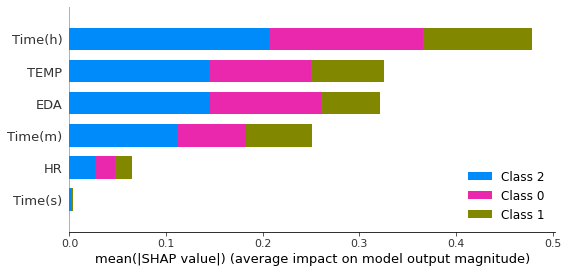

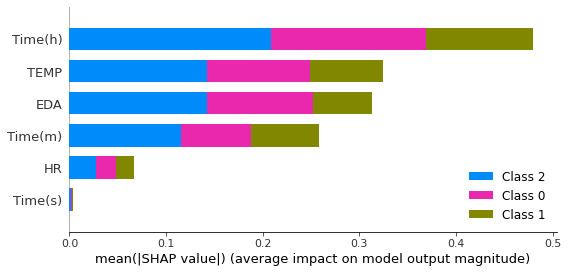

In [76]:
shap.summary_plot(shap_values, X_train, plot_type="bar", feature_names=features)
shap.summary_plot(shap_values_test, X_test, plot_type="bar", feature_names=features)

##### SHAP With XGBoost

In [77]:
import xgboost as xgb

dtrain = xgb.DMatrix(X_train, label=y_train)
dval = xgb.DMatrix(X_val, label=y_val)
dtest = xgb.DMatrix(X_test, label=y_test)

In [78]:
fitted_xgb_model = xgb.XGBRegressor(max_depth=7, learning_rate=0.8,\
                    n_jobs=4, objective='reg:squarederror',\
                    n_estimators=50).\
                    fit(X_train, y_train,\
                    eval_set=[(X_train, y_train),(X_val, y_val)],\
                    eval_metric='rmse')

[0]	validation_0-rmse:0.61699	validation_1-rmse:0.77786
[1]	validation_0-rmse:0.54954	validation_1-rmse:0.65750
[2]	validation_0-rmse:0.52079	validation_1-rmse:0.62138
[3]	validation_0-rmse:0.47986	validation_1-rmse:0.57576
[4]	validation_0-rmse:0.45776	validation_1-rmse:0.54966
[5]	validation_0-rmse:0.43525	validation_1-rmse:0.52294
[6]	validation_0-rmse:0.40199	validation_1-rmse:0.48408
[7]	validation_0-rmse:0.37647	validation_1-rmse:0.45288
[8]	validation_0-rmse:0.35490	validation_1-rmse:0.42714
[9]	validation_0-rmse:0.34359	validation_1-rmse:0.41607
[10]	validation_0-rmse:0.33734	validation_1-rmse:0.40912
[11]	validation_0-rmse:0.32414	validation_1-rmse:0.39553
[12]	validation_0-rmse:0.31274	validation_1-rmse:0.38287
[13]	validation_0-rmse:0.30317	validation_1-rmse:0.37092
[14]	validation_0-rmse:0.29456	validation_1-rmse:0.36162
[15]	validation_0-rmse:0.28762	validation_1-rmse:0.35365
[16]	validation_0-rmse:0.28268	validation_1-rmse:0.34820
[17]	validation_0-rmse:0.27674	validation

In [79]:
y_train_xgb_pred = fitted_xgb_model.predict(X_train)
y_test_xgb_pred = fitted_xgb_model.predict(X_test)
RMSE_xgb_train = math.sqrt(\
                    metrics.mean_squared_error(y_train,\
                                               y_train_xgb_pred))
RMSE_xgb_test = math.sqrt(\
                    metrics.mean_squared_error(y_test,
                                               y_test_xgb_pred))
R2_xgb_test = metrics.r2_score(y_test, y_test_xgb_pred)
print('RMSE_train: %.4f\tRMSE_test: %.4f\tr2: %.4f' %\
                    (RMSE_xgb_train, RMSE_xgb_test, R2_xgb_test))

RMSE_train: 0.1894	RMSE_test: 0.2348	r2: 0.9121


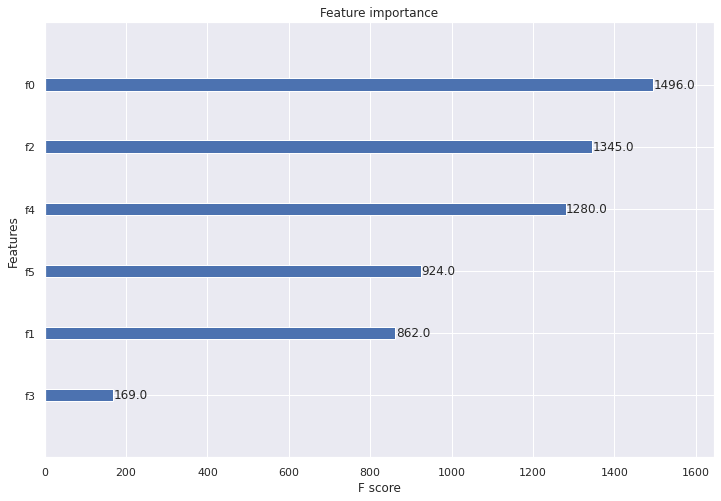

In [80]:
## How often feature appears in the tree (weight)
## How often feature appears in the tree (weight)
sns.set()
fig, ax = plt.subplots(figsize=(12, 8))
xgb.plot_importance(fitted_xgb_model, max_num_features=12, ax=ax,\
                    importance_type="weight")
plt.show()

In [81]:
background = X_train[np.random.choice(X_train.shape[0], 3000, replace=False)]

shap_xgb_explainer = shap.TreeExplainer(fitted_xgb_model, background)

In [82]:
random_indices = np.random.choice(len(X_train), size=3000, replace=False) 
random_indices2 = np.random.choice(len(X_test), size=3000, replace=False) 

In [83]:
shap_xgb_values_train = shap_xgb_explainer.shap_values(X_train[random_indices])
print(shap_xgb_values_train.shape)
shap_xgb_values_test = shap_xgb_explainer.shap_values(X_test[random_indices2])
print(shap_xgb_values_test.shape)

(3000, 6)
(3000, 6)


In [84]:
#shap_nn_explainer = shap.GradientExplainer(pre_model, background.astype(float).values)
shap_nn_explainer = shap.KernelExplainer(pre_model, background)

Using 3000 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [85]:
shap_nn_values_test = shap_nn_explainer.shap_values(X_test[random_indices2])
print(type(shap_nn_values_test))
print(shap_nn_values_test[0].shape)


<class 'list'>
(3000, 6)


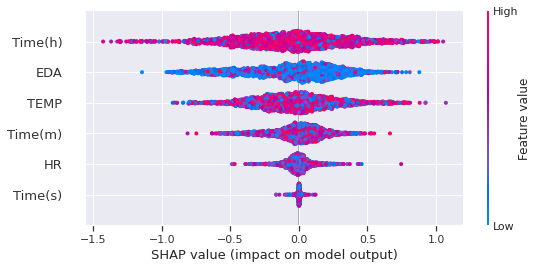

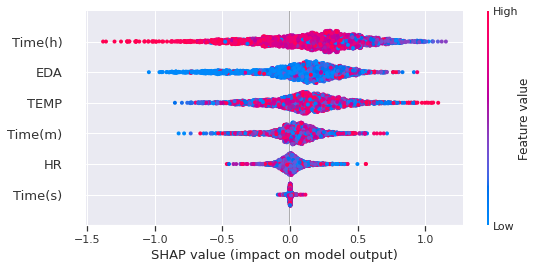

In [86]:
shap.summary_plot(shap_xgb_values_train, X_train[random_indices2], feature_names=features, plot_type="dot")
shap.summary_plot(shap_xgb_values_test, X_test[random_indices2], feature_names=features, plot_type="dot")

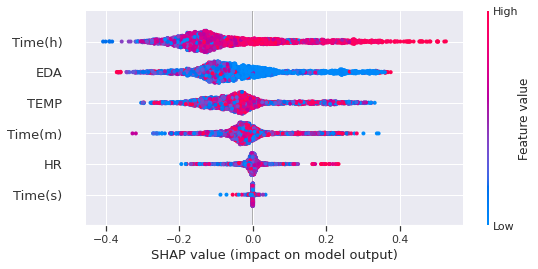

In [87]:
shap.summary_plot(shap_nn_values_test[0], X_test[random_indices2], feature_names=features, plot_type="dot")

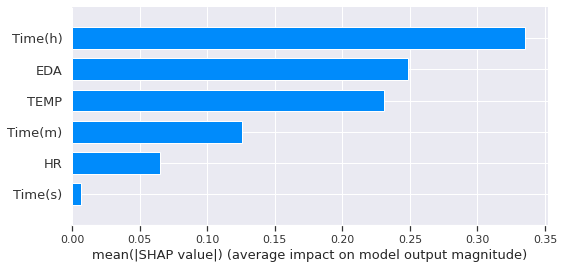

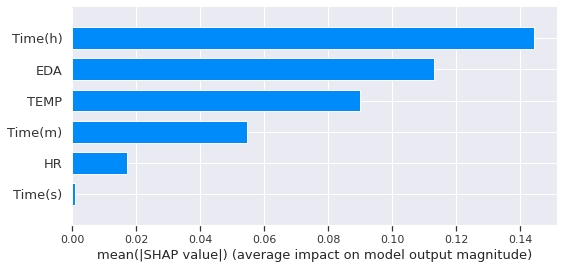

In [88]:
shap.summary_plot(shap_xgb_values_test, X_test[random_indices2], feature_names=features, plot_type="bar")
shap.summary_plot(shap_nn_values_test[0], X_test[random_indices2], feature_names=features, plot_type="bar")

#### Lime

In [89]:
import lime
from lime.lime_tabular import LimeTabularExplainer

lime_explainer = lime.lime_tabular.LimeTabularExplainer(X_train,\
                        feature_names=features, class_names=['Fail.', 'Good', 'Great'])

In [90]:
lime_explainer.explain_instance(X_train[0],\
                                    pre_model.predict).\
                                show_in_notebook(predict_proba=True)

In [91]:
lime_explainer.explain_instance(X_train[1],\
                                    pre_model.predict).\
                                show_in_notebook(predict_proba=True)

In [92]:
lime_explainer.explain_instance(X_train[2],\
                                    pre_model.predict).\
                                show_in_notebook(predict_proba=True)

In [93]:
lime_explainer.explain_instance(X_test[0],\
                                    pre_model.predict).\
                                show_in_notebook(predict_proba=True)

In [94]:
lime_explainer.explain_instance(X_test[1],\
                                    pre_model.predict).\
                                show_in_notebook(predict_proba=True)

In [95]:
lime_explainer.explain_instance(X_test[2],\
                                    pre_model.predict).\
                                show_in_notebook(predict_proba=True)

### Generative AI

##### TensorFlow: <br>

TensorFlow is a popular open-source machine learning library that can be used for a variety of tasks, including generative AI. TensorFlow provides a wide range of tools and resources for building and training generative models, such as convolutional neural networks (CNNs) and recurrent neural networks (RNNs).

TensorFlow can be used to train and deploy a variety of generative models, including: 

Generative adversarial networks (GANs) 
Variational autoencoders (VAEs) 
Transformer-based text generation models 
Diffusion models 
TensorFlow is a good choice for generative AI because it is flexible and powerful, and it has a large community of users and contributors. 

#### Part 1
predecting "Performance" using pre_model from the nurses data.

In [27]:
#!pip install tensorflow-gan

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.layers import Dense, Reshape, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam


# Define the generator model
def build_generator():
    model = Sequential()
    model.add(Dense(X_train.shape[1],activation='relu',input_shape=(X_train.shape[1],)),)
    model.add(Dense(128, input_dim=latent_dim, activation='relu'))
    model.add(Dense(256, activation='relu'))
    model.add(Dense(6, activation='softmax'))
    return model

# Define the discriminator model
def build_discriminator():
    model = Sequential()
    model.add(Dense(X_train.shape[1],activation='relu',input_shape=(X_train.shape[1],)),)
    model.add(Dense(512, activation='relu'))
    model.add(Dense(256, activation='relu'))
    model.add(Dense(6, activation='softmax'))
    return model

# Define the combined GAN model
def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = Sequential()
    model.add(generator)
    model.add(discriminator)
    model.compile(loss='sparse_categorical_crossentropy', optimizer=Adam(learning_rate=0.0002, beta_1=0.5))
    return model

# Generate random noise as input to the generator
def generate_noise(latent_dim, n_samples):
    return np.random.normal(0, 2, (n_samples, latent_dim))

# Train the GAN model
def train_gan(generator, discriminator, gan, X_train, y_train, n_epochs, batch_size):
    for epoch in range(n_epochs):
        
        # Select a random batch of data
        idx = np.random.randint(0, X_train.shape[1], batch_size)
        real_samples = X_train
        real_labels = y_train
        
        # Generate random noise
        #noise_indices = np.random.randint(0, 2, batch_size)  # 0 for X_train, 1 for X_test
        #noise_data = [X_train, X_test]
        #noise = np.array([noise_data[noise_indices[i]][np.random.randint(0, noise_data[noise_indices[i]].shape[0])] for i in range(batch_size)])

        noise = np.random.normal(0, 2, (batch_size, 6))
        
        # Generate fake samples
        fake_samples = generator.predict(noise)
        fake_labels = 2 * np.ones((batch_size,))
        
        # Concatenate real and fake data
        X_gan = np.concatenate((real_samples, fake_samples))
        y_gan = np.concatenate((real_labels, fake_labels))

        # Train the discriminator
        d_loss = discriminator.train_on_batch(X_gan, y_gan)
        
        # Generate new noise
        noise = generate_noise(6, batch_size)
        y_gen = np.random.randint(0, 6, batch_size)
        
        # Train the generator (via the GAN model)
        gan_loss = gan.train_on_batch(noise, y_gen)
        
        # Print progress
        if epoch % 100 == 0:
            print(f"Epoch: {epoch}, Discriminator Loss: {d_loss}, GAN Loss: {gan_loss}")

# Define hyperparameters
latent_dim = 6
n_epochs = 10000
batch_size = 128
input_dim = X_train.shape[1]  # Dimensionality of each sample in the dataset
n_samples = 100

# Build the generator
generator = build_generator()

# Build and compile the discriminator
discriminator = build_discriminator()
discriminator.compile(loss='sparse_categorical_crossentropy', optimizer=Adam(learning_rate=0.0002, beta_1=0.5), metrics=['accuracy'])


# Build and compile the GAN model
gan = build_gan(generator, discriminator)

# Train the GAN model
train_gan(generator, discriminator, gan, X_train, y_train, n_epochs, batch_size)


Epoch: 0, Discriminator Loss: [1.8120369911193848, 0.19397740066051483], GAN Loss: 1.7925822734832764
Epoch: 100, Discriminator Loss: [1.0759788751602173, 0.44041019678115845], GAN Loss: 1.933495044708252
Epoch: 200, Discriminator Loss: [0.963786244392395, 0.5249584913253784], GAN Loss: 2.429311513900757
Epoch: 300, Discriminator Loss: [0.916504442691803, 0.5584291219711304], GAN Loss: 2.888424873352051
Epoch: 400, Discriminator Loss: [0.8944647908210754, 0.5617073178291321], GAN Loss: 3.7092323303222656
Epoch: 500, Discriminator Loss: [0.8777093887329102, 0.5659465789794922], GAN Loss: 3.636974573135376
Epoch: 600, Discriminator Loss: [0.8675650358200073, 0.5628600120544434], GAN Loss: 3.6868181228637695
Epoch: 700, Discriminator Loss: [0.8557223677635193, 0.5711130499839783], GAN Loss: 3.608229637145996
Epoch: 800, Discriminator Loss: [0.8361626863479614, 0.5844329595565796], GAN Loss: 4.723920822143555
Epoch: 900, Discriminator Loss: [0.825298547744751, 0.5900008678436279], GAN Loss

In [ ]:
# Generate samples
def generate_samples(generator, n_samples=10):
    #noise = np.random.normal(0, 1, (n_samples, input_shape))
    noise = np.random.normal(0, 2, (n_samples, X_train.shape[1]))
    generated_data = generator.predict(noise)
    return generated_data

# Generate and plot samples
generated_data = generate_samples(generator)

print("Generated Data:")
print(generated_data[:10])

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

## Feature Scaling
sc = RobustScaler()
generated_data = sc.fit_transform(generated_data)
X_val = sc.transform(X_val)
X_test = sc.transform(X_test)

In [ ]:
# Train the model
pre_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

histroy = pre_model.fit(generated_data, y_train, validation_data=(X_val,y_val), epochs= 10, batch_size=1000, callbacks=[early_stop])

In [ ]:
metrics_df = pd.DataFrame(history.history)
metrics_df

# Accuracy
metrics_df[['accuracy','val_accuracy']].plot()

# Loss
metrics_df[['loss','val_loss']].plot()

In [ ]:
y_preds = pre_model.predict(X_test)
y_preds

## flattened array
y_true_pred = np.argmax(y_preds, axis=1)
y_true_pred

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_true_pred)
print(cm)
#accuracy_score(y_test, y_true_pred)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

cf_matrix = confusion_matrix(y_test, y_true_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,\
            fmt='.2%', cmap='Blues', annot_kws={'size':16})

In [ ]:
loss, accuracy = pre_model.evaluate(X_val, y_train)
print(f'Model Accuracy: {accuracy}')

In [ ]:
loss, accuracy = pre_model.evaluate(X_val, y_val)
print(f'Validation Accuracy: {accuracy}')

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, r2_score, mean_squared_error
#y_true_pred = np.argmax(y_preds, axis=1)

accuracy = accuracy_score(y_test, y_true_pred)
print(f"Accuracy: {accuracy}")

print('Precision:', precision_score(y_test, y_true_pred, average='weighted'))
print('Recall:', recall_score(y_test, y_true_pred, average='weighted'))
print('F1-score:', f1_score(y_test, y_true_pred, average='weighted'))

# Evaluate the model performance using R-squared and RMSE metrics
print('R-squared score for performance prediction:', r2_score(y_test, y_true_pred))
print('RMSE for performance prediction:', mean_squared_error(y_test, y_true_pred, squared=False))

### Training the students dataset to determine performance without the stress attribute. -> Part1: Performance

In [184]:
df4

,EDA,HR,TEMP,Time(s),Time(m),Time(h),Score,Performance,Predicted_Stress_Label
0,0.002563,84.000000,22.51,0.241551,0.004026,0.000067,78.0,2,2
1,0.019221,85.000000,22.51,0.362327,0.006039,0.000101,78.0,2,0
2,0.021784,86.000000,22.51,0.483103,0.008052,0.000134,78.0,2,0
3,0.023065,86.750000,22.51,0.603878,0.010065,0.000168,78.0,2,0
4,0.024347,87.400000,22.51,0.724654,0.012078,0.000201,78.0,2,0
...,...,...,...,...,...,...,...,...,...
244562,0.021781,104.040514,22.51,10799.063841,179.984397,2.999740,58.0,1,0
244563,0.020500,104.040514,22.53,10799.180861,179.986348,2.999772,58.0,1,0
244564,0.021781,104.040514,22.53,10799.297881,179.988298,2.999805,58.0,1,0
244565,0.021781,104.040514,22.53,10799.414901,179.990248,2.999837,58.0,1,0


In [185]:
X = df4.drop(["Performance", "Score", 'Predicted_Stress_Label'], axis = 1).values
y = df4['Performance'].values

## Not enough Samples for 0, 1 in labels
over_sample = SMOTETomek(random_state=42)
#X, y = over_sample.fit_resample(X, y)

In [186]:
## Training the model
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.1, random_state=42)

X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [187]:
X_train, y_train = over_sample.fit_resample(X_train, y_train)
#X_val, y_val = over_sample.fit_resample(X_val, y_val)

In [188]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping

#base_model = Dense(X_train.shape[1],activation='relu',input_shape=(X_train.shape[1],))

pre_model2 = Sequential([
    Dense(X_train.shape[1],activation='relu',input_shape=(X_train.shape[1],)),
    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(3, activation='softmax')
                ])

pre_model2.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

In [189]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

## Feature Scaling
sc = RobustScaler()
X_train = sc.fit_transform(X_train)
X_val = sc.transform(X_val)
X_test = sc.transform(X_test)

In [190]:
initial_epochs = 50
history = pre_model2.fit(X_train, y_train, validation_data=(X_val,y_val), epochs= initial_epochs, batch_size=1000, callbacks=[early_stop])

Epoch 1/50
2631/2631 [==============================] - 8s 3ms/step - loss: 0.7048 - accuracy: 0.6718 - val_loss: 0.6592 - val_accuracy: 0.6643
Epoch 2/50
2631/2631 [==============================] - 7s 3ms/step - loss: 0.5181 - accuracy: 0.7719 - val_loss: 0.5848 - val_accuracy: 0.7094
Epoch 3/50
2631/2631 [==============================] - 7s 3ms/step - loss: 0.4327 - accuracy: 0.8117 - val_loss: 0.4800 - val_accuracy: 0.7713
Epoch 4/50
2631/2631 [==============================] - 8s 3ms/step - loss: 0.3817 - accuracy: 0.8356 - val_loss: 0.4256 - val_accuracy: 0.8014
Epoch 5/50
2631/2631 [==============================] - 7s 3ms/step - loss: 0.3476 - accuracy: 0.8511 - val_loss: 0.4178 - val_accuracy: 0.8077
Epoch 6/50
2631/2631 [==============================] - 7s 3ms/step - loss: 0.3214 - accuracy: 0.8628 - val_loss: 0.4034 - val_accuracy: 0.8093
Epoch 7/50
2631/2631 [==============================] - 7s 3ms/step - loss: 0.3036 - accuracy: 0.8702 - val_loss: 0.3656 - val_accuracy:

<AxesSubplot:>

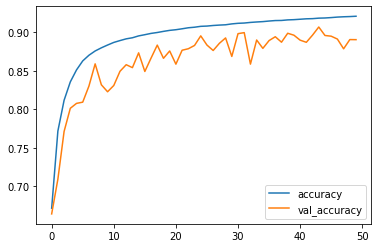

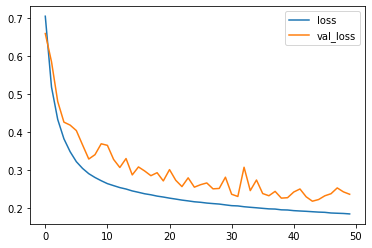

In [191]:
metrics_df = pd.DataFrame(history.history)
metrics_df

# Accuracy
metrics_df[['accuracy','val_accuracy']].plot()

# Loss
metrics_df[['loss','val_loss']].plot()

In [192]:
y_preds = pre_model2.predict(X_test)
y_preds

## flattened array
y_true_pred = np.argmax(y_preds, axis=1)
y_true_pred

array([2, 2, 1, ..., 0, 2, 1])

In [193]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_true_pred)
print(cm)
#accuracy_score(y_test, y_true_pred)

[[ 4382   109    51]
 [  968 25143  1114]
 [ 2370  4369 42673]]


<AxesSubplot:>

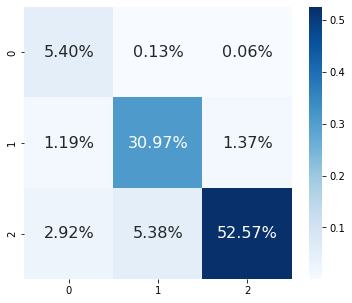

In [194]:
import seaborn as sns
import matplotlib.pyplot as plt

cf_matrix = confusion_matrix(y_test, y_true_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,\
            fmt='.2%', cmap='Blues', annot_kws={'size':16})

In [195]:
pre_model2.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 6)                 42        
_________________________________________________________________
dense_13 (Dense)             (None, 256)               1792      
_________________________________________________________________
dense_14 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_15 (Dense)             (None, 3)                 387       
Total params: 35,117
Trainable params: 35,117
Non-trainable params: 0
_________________________________________________________________


In [196]:
pre_model2.save('StudentsPerformance.h5')

In [197]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, r2_score, mean_squared_error

accuracy = accuracy_score(y_test, y_true_pred)
print(f"Accuracy: {accuracy}")

print('Precision:', precision_score(y_test, y_true_pred, average='weighted'))
print('Recall:', recall_score(y_test, y_true_pred, average='weighted'))
print('F1-score:', f1_score(y_test, y_true_pred, average='weighted'))

# Evaluate the model performance using R-squared and RMSE metrics
print('R-squared score for id prediction:', r2_score(y_test, y_true_pred))
print('RMSE for id prediction:', mean_squared_error(y_test, y_true_pred, squared=False))

Accuracy: 0.8893679399844787
Precision: 0.9089321594159038
Recall: 0.8893679399844787
F1-score: 0.8937448739449242
R-squared score for id prediction: 0.4428025890715417
RMSE for id prediction: 0.4473265153613171


In [198]:
## Option test 2:
## Reference: row(20) https://www.kaggle.com/code/osmanballi/transfer-learning-ann-knn-svm-dt

#from keras.models import Model
#new_model = Model(inputs=pre_model.input,outputs=pre_model.get_layer('dense_4').output)

## Students Stress Data

#### Predicting Performance

In [199]:
df5 = largedataset.copy()

num_duplicated_rows = df5.duplicated().sum()
num_duplicated_rows

105606

In [200]:
num_duplicated_rows/len(df3) * 100

0.9260885635875826

In [201]:
df5.drop_duplicates(inplace=True)

In [202]:
import time

df5['datetime'] = pd.to_datetime(df5['datetime'])
df5['time(s)'] = df5['datetime'].apply(lambda x: x.second)
df5['time(m)'] = df5['datetime'].apply(lambda x: x.minute)
df5['time(h)'] = df5['datetime'].apply(lambda x: x.hour)
df5['day'] = df5['datetime'].apply(lambda x: x.day)
df5['month'] = df5['datetime'].apply(lambda x: x.month)
df5['year'] = df5['datetime'].apply(lambda x: x.year)


In [203]:
df5.drop(['datetime', 'X','Y','Z'],axis=1, inplace=True)

In [204]:
df5.head()

,EDA,HR,TEMP,id,label,time(s),time(m),time(h),day,month,year
0,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020
1,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020
2,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020
3,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020
4,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020


In [205]:
df5.dropna(axis = 0, inplace = True)

In [206]:
test_set = df5.copy()

In [207]:
test_set =  test_set.drop(['day', 'label', 'year','month', "id"], axis = 1)

In [208]:
X = test_set.values

print(X.shape)

(11403445, 6)


In [209]:
test_set

,EDA,HR,TEMP,time(s),time(m),time(h)
0,6.769995,99.43,31.17,0,3,14
1,6.769995,99.43,31.17,0,3,14
2,6.769995,99.43,31.17,0,3,14
3,6.769995,99.43,31.17,0,3,14
4,6.769995,99.43,31.17,0,3,14
...,...,...,...,...,...,...
11509046,3.386070,88.37,33.77,59,28,17
11509047,3.386070,88.37,33.77,59,28,17
11509048,3.386070,88.37,33.77,59,28,17
11509049,3.386070,88.37,33.77,59,28,17


In [210]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

## Feature Scaling
sc = RobustScaler()
X = sc.fit_transform(X)

In [211]:
# Predict stress labels for dataset2
predictions = pre_model2.predict(X)

## flattened array
y_true_pred_students = np.argmax(predictions, axis=1)
y_true_pred_students

# Save the predicted labels to dataset2 or do further analysis
#df4['Predicted_Stress_Label'] = y_true_pred_students


array([2, 2, 2, ..., 1, 1, 1])

In [212]:
y_true_pred_students

array([2, 2, 2, ..., 1, 1, 1])

In [213]:
df5['Predicted_Performance'] = y_true_pred_students

In [214]:
df5

,EDA,HR,TEMP,id,label,time(s),time(m),time(h),day,month,year,Predicted_Performance
0,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020,2
1,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020,2
2,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020,2
3,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020,2
4,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020,2
...,...,...,...,...,...,...,...,...,...,...,...,...
11509046,3.386070,88.37,33.77,F5,2.0,59,28,17,23,7,2020,1
11509047,3.386070,88.37,33.77,F5,2.0,59,28,17,23,7,2020,1
11509048,3.386070,88.37,33.77,F5,2.0,59,28,17,23,7,2020,1
11509049,3.386070,88.37,33.77,F5,2.0,59,28,17,23,7,2020,1


In [215]:
df5['Predicted_Performance'].value_counts()

2    5094424
1    3782804
0    2526217
Name: Predicted_Performance, dtype: int64

In [216]:
df_analysis2_1 = df5.copy()

In [217]:
df_analysis2_1.drop(['EDA','HR','TEMP', 'time(s)','time(m)', 'time(h)', 'day', 'year','month'], axis=1, inplace=True)

In [218]:
df_analysis2_1.groupby(['id', 'label']).mean()

Predicted_Performance
id label                       
15 0.0                 1.288595
   2.0                 1.198807
83 0.0                 1.654151
   2.0                 1.660499
94 0.0                 1.042654
   1.0                 1.139210
   2.0                 1.282619
15 2.0                 0.647413
5C 0.0                 1.231395
   1.0                 1.064822
   2.0                 1.039514
6B 0.0                 1.029148
   2.0                 1.015847
6D 0.0                 1.137545
   2.0                 1.148106
7A 0.0                 1.240289
   1.0                 1.165001
   2.0                 1.258998
7E 0.0                 0.874654
   2.0                 1.044607
83 2.0                 1.894105
8B 0.0                 1.094804
   2.0                 0.992638
94 0.0                 0.750969
   2.0                 1.221519
BG 0.0                 1.373071
   2.0                 1.710777
CE 1.0                 0.781209
   2.0                 0.931873
DF 0.0                 1.099982
   2.0                 1.113009
E4 0.0                 1.275515
   1.0                 0.560380
   2.0                 1.307862
EG 2.0                 1.045276
F5 0.0                 1.420331
   2.0                 1.217697

In [219]:
df_analysis2_1.groupby(['id']).mean()

,label,Predicted_Performance
id,,
15,1.897453,1.203411
83,1.750970,1.659708
94,0.502339,1.099018
15,2.000000,0.647413
5C,0.944572,1.116654
6B,1.737068,1.017596
6D,0.298707,1.139123
7A,1.666811,1.233481
7E,1.075752,0.966068


In [220]:
df_analysis2_2 = df5.copy()

In [221]:
df_analysis2_2.drop(['EDA','HR','TEMP', 'time(s)','time(m)', 'time(h)',  'year', 'month', ], axis=1, inplace=True)

In [222]:
df_analysis2_2.groupby(['id', 'label', 'day']).mean()

Predicted_Performance
id label day                       
15 0.0   21                1.288595
   2.0   8                 1.244274
         21                1.075820
         22                1.233828
         24                1.158648
...                             ...
F5 2.0   17                1.056856
         20                1.537940
         21                1.300066
         22                1.206577
         23                1.467711

[130 rows x 1 columns]

In [223]:
df_analysis2_2.groupby(['id', 'label', 'day']).mean().to_csv('DaysPerformanceLevelPart1.csv', index=True)

In [224]:
df_analysis2_3 = df5.copy()

In [225]:
df_analysis2_3.drop(['EDA','HR','TEMP', 'time(s)','time(m)', 'time(h)',  'year', 'day', ], axis=1, inplace=True)

In [226]:
df_analysis2_3.groupby(['id', 'label', 'month']).mean()

Predicted_Performance
id label month                       
15 0.0   7                   1.288595
   2.0   7                   1.198807
83 0.0   11                  1.654151
   2.0   10                  1.814468
         11                  1.848177
...                               ...
E4 2.0   7                   1.450664
EG 2.0   11                  1.060790
         12                  0.838936
F5 0.0   7                   1.420331
   2.0   7                   1.217697

[62 rows x 1 columns]

In [227]:
df_analysis2_3.groupby(['id', 'label', 'month']).mean().to_csv('MonthsPerformanceLevelPart1.xlsx', index=True)

In [228]:
df_analysis2_4 = df5.copy()

In [229]:
df_analysis2_4.drop(['EDA','HR','TEMP', 'time(s)','time(m)', 'time(h)',  'year', 'day', 'id' ], axis=1, inplace=True)

In [230]:
df_analysis2_4.groupby(['month']).mean()

,label,Predicted_Performance
month,,
4,1.877031,1.312775
5,1.215060,1.100981
6,1.316576,1.112017
7,1.465043,1.124384
8,2.000000,1.100060
10,1.558812,1.554684
11,1.659822,1.353381
12,1.965187,1.621680


In [231]:
df_analysis2_5 = df5.copy()

In [232]:
df_analysis2_5.drop(['EDA','HR','TEMP', 'time(s)','time(m)', 'time(h)', 'month',  'year', 'day', 'id' ], axis=1, inplace=True)

In [233]:
df_analysis2_5.groupby(['label']).mean()

,Predicted_Performance
label,
0.0,1.175448
1.0,1.102262
2.0,1.249154


#### Training the nurses dataset using Graudal Freezing

In [234]:
# Gradually unfreeze layers and train the entire model
for layer in pre_model.layers[:-4]:
    layer.trainable = False

pre_model2.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

pre_model2.fit(X_train, y_train, validation_data=(X_val,y_val), epochs= 10, batch_size=1000, callbacks=[early_stop])

# Unfreeze more layers and continue training
for layer in pre_model.layers[:-6]:
    layer.trainable = True

pre_model2.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

pre_model2.fit(X_train, y_train, validation_data=(X_val,y_val), epochs= 10, batch_size=1000, callbacks=[early_stop])

Epoch 1/10
2631/2631 [==============================] - 12s 5ms/step - loss: 0.1832 - accuracy: 0.9211 - val_loss: 0.2512 - val_accuracy: 0.8892
Epoch 2/10
2631/2631 [==============================] - 12s 5ms/step - loss: 0.1825 - accuracy: 0.9212 - val_loss: 0.2340 - val_accuracy: 0.8900
Epoch 3/10
2631/2631 [==============================] - 12s 5ms/step - loss: 0.1813 - accuracy: 0.9217 - val_loss: 0.2163 - val_accuracy: 0.9013
Epoch 4/10
2631/2631 [==============================] - 12s 5ms/step - loss: 0.1806 - accuracy: 0.9220 - val_loss: 0.2203 - val_accuracy: 0.8999
Epoch 5/10
2631/2631 [==============================] - 12s 5ms/step - loss: 0.1794 - accuracy: 0.9225 - val_loss: 0.2279 - val_accuracy: 0.8969
Epoch 6/10
2631/2631 [==============================] - 12s 5ms/step - loss: 0.1792 - accuracy: 0.9227 - val_loss: 0.2226 - val_accuracy: 0.9016
Epoch 7/10
2631/2631 [==============================] - 12s 5ms/step - loss: 0.1781 - accuracy: 0.9231 - val_loss: 0.2318 - val_ac

<AxesSubplot:>

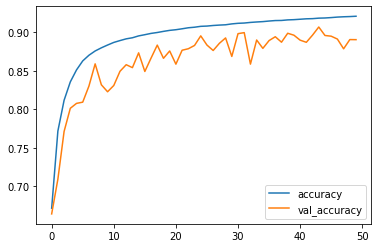

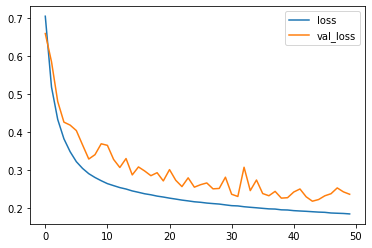

In [235]:
metrics_df = pd.DataFrame(history.history)
metrics_df

# Accuracy
metrics_df[['accuracy','val_accuracy']].plot()

# Loss
metrics_df[['loss','val_loss']].plot()

In [236]:
y_preds = pre_model.predict(X_test)
y_preds

## flattened array
y_true_pred = np.argmax(y_preds, axis=1)
y_true_pred

array([2, 2, 1, ..., 1, 2, 1])

In [237]:
#loss, accuracy = pre_model.evaluate(X_val, y_train)
#print(f'Model Accuracy: {accuracy}')

In [238]:
loss, accuracy = pre_model.evaluate(X_val, y_val)
print(f'Validation Accuracy: {accuracy}')

2537/2537 [==============================] - 4s 2ms/step - loss: 0.2269 - accuracy: 0.9022
Validation Accuracy: 0.9021779298782349


In [239]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_true_pred)
print(cm)
#accuracy_score(y_test, y_true_pred)

[[ 4469    45    28]
 [  326 26373   526]
 [ 1329  5500 42583]]


<AxesSubplot:>

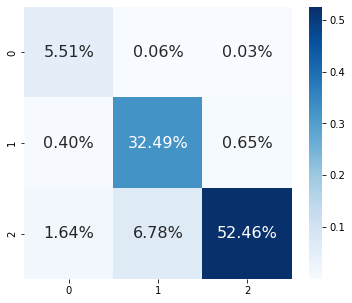

In [240]:
import seaborn as sns
import matplotlib.pyplot as plt

cf_matrix = confusion_matrix(y_test, y_true_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,\
            fmt='.2%', cmap='Blues', annot_kws={'size':16})

In [241]:
#y_true_pred = np.argmax(y_preds, axis=1)
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, r2_score, mean_squared_error

accuracy = accuracy_score(y_test, y_true_pred)
print(f"Accuracy: {accuracy}")

print('Precision:', precision_score(y_test, y_true_pred, average='weighted'))
print('Recall:', recall_score(y_test, y_true_pred, average='weighted'))
print('F1-score:', f1_score(y_test, y_true_pred, average='weighted'))

# Evaluate the model performance using R-squared and RMSE metrics
print('R-squared score for id prediction:', r2_score(y_test, y_true_pred))
print('RMSE for id prediction:', mean_squared_error(y_test, y_true_pred, squared=False))

Accuracy: 0.9044826864090467
Precision: 0.918799716382345
Recall: 0.9044826864090467
F1-score: 0.9061045387601361
R-squared score for id prediction: 0.5943819635416757
RMSE for id prediction: 0.38166182805556464


### Determining Performance including Stress Label atttribute

In [242]:
df4

,EDA,HR,TEMP,Time(s),Time(m),Time(h),Score,Performance,Predicted_Stress_Label
0,0.002563,84.000000,22.51,0.241551,0.004026,0.000067,78.0,2,2
1,0.019221,85.000000,22.51,0.362327,0.006039,0.000101,78.0,2,0
2,0.021784,86.000000,22.51,0.483103,0.008052,0.000134,78.0,2,0
3,0.023065,86.750000,22.51,0.603878,0.010065,0.000168,78.0,2,0
4,0.024347,87.400000,22.51,0.724654,0.012078,0.000201,78.0,2,0
...,...,...,...,...,...,...,...,...,...
244562,0.021781,104.040514,22.51,10799.063841,179.984397,2.999740,58.0,1,0
244563,0.020500,104.040514,22.53,10799.180861,179.986348,2.999772,58.0,1,0
244564,0.021781,104.040514,22.53,10799.297881,179.988298,2.999805,58.0,1,0
244565,0.021781,104.040514,22.53,10799.414901,179.990248,2.999837,58.0,1,0


In [243]:
X = df4.drop(["Performance", "Score"], axis = 1).values
y = df4['Performance'].values

## Not enough Samples for 0, 1 in labels
over_sample = SMOTETomek(random_state=42)
#X, y = over_sample.fit_resample(X, y)

In [244]:
## Training the model
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.1, random_state=42)

X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [245]:
X_train, y_train = over_sample.fit_resample(X_train, y_train)
#X_val, y_val = over_sample.fit_resample(X_val, y_val)

In [246]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping

#base_model = Dense(X_train.shape[1],activation='relu',input_shape=(X_train.shape[1],))

pre_model2 = Sequential([
    Dense(X_train.shape[1],activation='relu',input_shape=(X_train.shape[1],)),
    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(3, activation='softmax')
                ])

pre_model2.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

In [247]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

## Feature Scaling
sc = RobustScaler()
X_train = sc.fit_transform(X_train)
X_val = sc.transform(X_val)
X_test = sc.transform(X_test)

In [248]:
initial_epochs = 50
history = pre_model2.fit(X_train, y_train, validation_data=(X_val,y_val), epochs= initial_epochs, batch_size=1000, callbacks=[early_stop])

Epoch 1/50
2633/2633 [==============================] - 12s 5ms/step - loss: 0.6391 - accuracy: 0.7020 - val_loss: 0.6011 - val_accuracy: 0.6967
Epoch 2/50
2633/2633 [==============================] - 12s 5ms/step - loss: 0.4428 - accuracy: 0.8045 - val_loss: 0.4960 - val_accuracy: 0.7529
Epoch 3/50
2633/2633 [==============================] - 12s 5ms/step - loss: 0.3696 - accuracy: 0.8460 - val_loss: 0.4255 - val_accuracy: 0.7943
Epoch 4/50
2633/2633 [==============================] - 12s 5ms/step - loss: 0.3269 - accuracy: 0.8663 - val_loss: 0.3671 - val_accuracy: 0.8365
Epoch 5/50
2633/2633 [==============================] - 12s 5ms/step - loss: 0.2989 - accuracy: 0.8766 - val_loss: 0.3535 - val_accuracy: 0.8369
Epoch 6/50
2633/2633 [==============================] - 12s 5ms/step - loss: 0.2785 - accuracy: 0.8839 - val_loss: 0.3372 - val_accuracy: 0.8464
Epoch 7/50
2633/2633 [==============================] - 12s 5ms/step - loss: 0.2651 - accuracy: 0.8886 - val_loss: 0.3641 - val_ac

<AxesSubplot:>

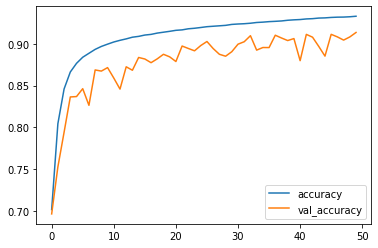

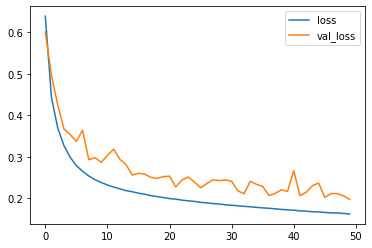

In [249]:
metrics_df = pd.DataFrame(history.history)
metrics_df

# Accuracy
metrics_df[['accuracy','val_accuracy']].plot()

# Loss
metrics_df[['loss','val_loss']].plot()

In [250]:
y_preds = pre_model2.predict(X_test)
y_preds

## flattened array
y_true_pred = np.argmax(y_preds, axis=1)
y_true_pred

array([2, 2, 1, ..., 1, 2, 1])

In [251]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_true_pred)
print(cm)
#accuracy_score(y_test, y_true_pred)

[[ 4413    51    78]
 [  526 25146  1553]
 [ 1073  3847 44492]]


In [252]:
import seaborn as sns
import matplotlib.pyplot as plt

cf_matrix = confusion_matrix(y_test, y_true_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,\
            fmt='.2%', cmap='Blues', annot_kws={'size':16})

<AxesSubplot:>

In [253]:
pre_model2.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_16 (Dense)             (None, 7)                 56        
_________________________________________________________________
dense_17 (Dense)             (None, 256)               2048      
_________________________________________________________________
dense_18 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_19 (Dense)             (None, 3)                 387       
Total params: 35,387
Trainable params: 35,387
Non-trainable params: 0
_________________________________________________________________


In [254]:
pre_model2.save('StudentsPerformance.h5')

In [255]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, r2_score, mean_squared_error

accuracy = accuracy_score(y_test, y_true_pred)
print(f"Accuracy: {accuracy}")

print('Precision:', precision_score(y_test, y_true_pred, average='weighted'))
print('Recall:', recall_score(y_test, y_true_pred, average='weighted'))
print('F1-score:', f1_score(y_test, y_true_pred, average='weighted'))

# Evaluate the model performance using R-squared and RMSE metrics
print('R-squared score for id prediction:', r2_score(y_test, y_true_pred))
print('RMSE for id prediction:', mean_squared_error(y_test, y_true_pred, squared=False))

Accuracy: 0.9121940403306273
Precision: 0.9185848043561122
Recall: 0.9121940403306273
F1-score: 0.9134774228972322
R-squared score for id prediction: 0.6370533239944585
RMSE for id prediction: 0.3610285179947754


In [256]:
## Option test 2:
## Reference: row(20) https://www.kaggle.com/code/osmanballi/transfer-learning-ann-knn-svm-dt

#from keras.models import Model
#new_model = Model(inputs=pre_model.input,outputs=pre_model.get_layer('dense_4').output)

## Students Stress Data

#### Predicting Performance

In [257]:
df5 = largedataset.copy()

num_duplicated_rows = df5.duplicated().sum()
num_duplicated_rows

105606

In [258]:
num_duplicated_rows/len(df3) * 100

0.9260885635875826

In [259]:
df5.drop_duplicates(inplace=True)

In [260]:
import time

df5['datetime'] = pd.to_datetime(df5['datetime'])
df5['time(s)'] = df5['datetime'].apply(lambda x: x.second)
df5['time(m)'] = df5['datetime'].apply(lambda x: x.minute)
df5['time(h)'] = df5['datetime'].apply(lambda x: x.hour)
df5['day'] = df5['datetime'].apply(lambda x: x.day)
df5['month'] = df5['datetime'].apply(lambda x: x.month)
df5['year'] = df5['datetime'].apply(lambda x: x.year)


In [261]:
df5.drop(['datetime', 'X','Y','Z'],axis=1, inplace=True)

In [262]:
df5.head()

,EDA,HR,TEMP,id,label,time(s),time(m),time(h),day,month,year
0,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020
1,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020
2,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020
3,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020
4,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020


In [263]:
df5.dropna(axis = 0, inplace = True)

In [264]:
test_set = df5.copy()

In [265]:
test_set =  test_set.drop(['day', 'year','month', "id"], axis = 1)

In [266]:
X = test_set.values

print(X.shape)

(11403445, 7)


In [267]:
test_set

,EDA,HR,TEMP,label,time(s),time(m),time(h)
0,6.769995,99.43,31.17,2.0,0,3,14
1,6.769995,99.43,31.17,2.0,0,3,14
2,6.769995,99.43,31.17,2.0,0,3,14
3,6.769995,99.43,31.17,2.0,0,3,14
4,6.769995,99.43,31.17,2.0,0,3,14
...,...,...,...,...,...,...,...
11509046,3.386070,88.37,33.77,2.0,59,28,17
11509047,3.386070,88.37,33.77,2.0,59,28,17
11509048,3.386070,88.37,33.77,2.0,59,28,17
11509049,3.386070,88.37,33.77,2.0,59,28,17


In [268]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

## Feature Scaling
sc = RobustScaler()
X = sc.fit_transform(X)

In [269]:
# Predict stress labels for dataset2
predictions = pre_model2.predict(X)

## flattened array
y_true_pred_students = np.argmax(predictions, axis=1)
y_true_pred_students

# Save the predicted labels to dataset2 or do further analysis
#df4['Predicted_Stress_Label'] = y_true_pred_students


array([2, 2, 2, ..., 2, 2, 1])

In [270]:
y_true_pred_students

array([2, 2, 2, ..., 2, 2, 1])

In [271]:
df5['Predicted_Performance'] = y_true_pred_students

In [272]:
df5

,EDA,HR,TEMP,id,label,time(s),time(m),time(h),day,month,year,Predicted_Performance
0,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020,2
1,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020,2
2,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020,2
3,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020,2
4,6.769995,99.43,31.17,15,2.0,0,3,14,8,7,2020,2
...,...,...,...,...,...,...,...,...,...,...,...,...
11509046,3.386070,88.37,33.77,F5,2.0,59,28,17,23,7,2020,2
11509047,3.386070,88.37,33.77,F5,2.0,59,28,17,23,7,2020,2
11509048,3.386070,88.37,33.77,F5,2.0,59,28,17,23,7,2020,2
11509049,3.386070,88.37,33.77,F5,2.0,59,28,17,23,7,2020,2


In [273]:
df5['Predicted_Performance'].value_counts()

2    5852156
1    4037542
0    1513747
Name: Predicted_Performance, dtype: int64

In [274]:
df_analysis2_1 = df5.copy()

In [275]:
df_analysis2_1.drop(['EDA','HR','TEMP', 'time(s)','time(m)', 'time(h)', 'day', 'year','month'], axis=1, inplace=True)

In [276]:
df_analysis2_1.groupby(['id', 'label']).mean()

Predicted_Performance
id label                       
15 0.0                 1.294695
   2.0                 1.291030
83 0.0                 1.124335
   2.0                 1.454682
94 0.0                 1.395012
   1.0                 1.580027
   2.0                 1.223157
15 2.0                 1.062251
5C 0.0                 1.493865
   1.0                 1.282578
   2.0                 1.117151
6B 0.0                 1.132894
   2.0                 1.377240
6D 0.0                 1.302671
   2.0                 1.205249
7A 0.0                 1.104336
   1.0                 1.248204
   2.0                 1.284958
7E 0.0                 1.499812
   2.0                 1.590957
83 2.0                 1.495821
8B 0.0                 1.494853
   2.0                 1.092403
94 0.0                 1.582846
   2.0                 1.067013
BG 0.0                 2.000000
   2.0                 1.568378
CE 1.0                 1.390032
   2.0                 1.320782
DF 0.0                 1.071934
   2.0                 1.533386
E4 0.0                 1.402870
   1.0                 1.376082
   2.0                 1.465772
EG 2.0                 1.326504
F5 0.0                 1.783340
   2.0                 1.456808

In [277]:
df_analysis2_1.groupby(['id']).mean()

,label,Predicted_Performance
id,,
15,1.897453,1.291218
83,1.750970,1.413549
94,0.502339,1.397044
15,2.000000,1.062251
5C,0.944572,1.308118
6B,1.737068,1.345117
6D,0.298707,1.288121
7A,1.666811,1.269041
7E,1.075752,1.548837


In [278]:
df_analysis2_2 = df5.copy()

In [279]:
df_analysis2_2.drop(['EDA','HR','TEMP', 'time(s)','time(m)', 'time(h)',  'year', 'month', ], axis=1, inplace=True)

In [280]:
df_analysis2_2.groupby(['id', 'label', 'day']).mean()

Predicted_Performance
id label day                       
15 0.0   21                1.294695
   2.0   8                 1.503962
         21                1.311392
         22                1.011094
         24                1.683426
...                             ...
F5 2.0   17                1.418449
         20                1.789749
         21                1.646189
         22                1.464603
         23                1.716648

[130 rows x 1 columns]

In [281]:
df_analysis2_2.groupby(['id', 'label', 'day']).mean().to_csv('DaysPerformanceLevelPart2.csv', index=True)

In [282]:
df_analysis2_3 = df5.copy()

In [283]:
df_analysis2_3.drop(['EDA','HR','TEMP', 'time(s)','time(m)', 'time(h)',  'year', 'day', ], axis=1, inplace=True)

In [284]:
df_analysis2_3.groupby(['id', 'label', 'month']).mean()

Predicted_Performance
id label month                       
15 0.0   7                   1.294695
   2.0   7                   1.291030
83 0.0   11                  1.124335
   2.0   10                  1.099086
         11                  1.528315
...                               ...
E4 2.0   7                   1.569316
EG 2.0   11                  1.320632
         12                  1.404599
F5 0.0   7                   1.783340
   2.0   7                   1.456808

[62 rows x 1 columns]

In [285]:
df_analysis2_3.groupby(['id', 'label', 'month']).mean().to_csv('MonthsPerformanceLevelPart2.xlsx', index=True)

In [286]:
df_analysis2_4 = df5.copy()

In [287]:
df_analysis2_4.drop(['EDA','HR','TEMP', 'time(s)','time(m)', 'time(h)',  'year', 'day', 'id' ], axis=1, inplace=True)

In [288]:
df_analysis2_4.groupby(['month']).mean()

,label,Predicted_Performance
month,,
4,1.877031,1.387448
5,1.215060,1.492588
6,1.316576,1.302066
7,1.465043,1.345380
8,2.000000,1.696295
10,1.558812,1.619492
11,1.659822,1.357694
12,1.965187,1.507756


In [289]:
df_analysis2_5 = df5.copy()

In [290]:
df_analysis2_5.drop(['EDA','HR','TEMP', 'time(s)','time(m)', 'time(h)', 'month',  'year', 'day', 'id' ], axis=1, inplace=True)

In [291]:
df_analysis2_5.groupby(['label']).mean()

,Predicted_Performance
label,
0.0,1.363634
1.0,1.304917
2.0,1.391641


#### Fine-Tuning Gradually 

In [292]:
# Gradually unfreeze layers and train the entire model
for layer in pre_model2.layers[:-4]:
    layer.trainable = False

pre_model2.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

pre_model2.fit(X_train, y_train, validation_data=(X_val,y_val), epochs= 10, batch_size=1000, callbacks=[early_stop])

# Unfreeze more layers and continue training
for layer in pre_model2.layers[:-6]:
    layer.trainable = True

pre_model2.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

pre_model2.fit(X_train, y_train, validation_data=(X_val,y_val), epochs= 10, batch_size=1000, callbacks=[early_stop])

Epoch 1/10
2633/2633 [==============================] - 12s 5ms/step - loss: 0.1613 - accuracy: 0.9330 - val_loss: 0.2110 - val_accuracy: 0.9063
Epoch 2/10
2633/2633 [==============================] - 12s 5ms/step - loss: 0.1607 - accuracy: 0.9334 - val_loss: 0.1901 - val_accuracy: 0.9176
Epoch 3/10
2633/2633 [==============================] - 11s 4ms/step - loss: 0.1595 - accuracy: 0.9340 - val_loss: 0.2419 - val_accuracy: 0.8898
Epoch 4/10
2633/2633 [==============================] - 12s 5ms/step - loss: 0.1588 - accuracy: 0.9343 - val_loss: 0.1975 - val_accuracy: 0.9114
Epoch 5/10
2633/2633 [==============================] - 12s 4ms/step - loss: 0.1582 - accuracy: 0.9347 - val_loss: 0.1975 - val_accuracy: 0.9094
Epoch 6/10
2633/2633 [==============================] - 12s 4ms/step - loss: 0.1574 - accuracy: 0.9348 - val_loss: 0.2215 - val_accuracy: 0.9029
Epoch 7/10
2633/2633 [==============================] - 12s 5ms/step - loss: 0.1570 - accuracy: 0.9351 - val_loss: 0.2012 - val_ac

<AxesSubplot:>

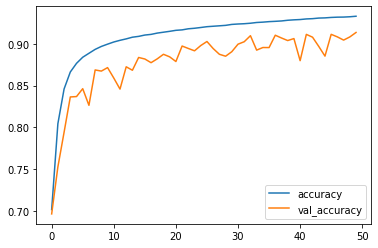

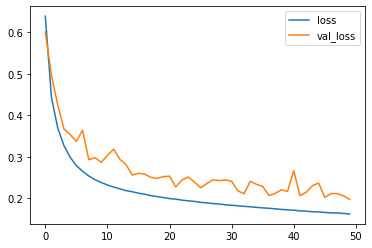

In [293]:
metrics_df = pd.DataFrame(history.history)
metrics_df

# Accuracy
metrics_df[['accuracy','val_accuracy']].plot()

# Loss
metrics_df[['loss','val_loss']].plot()

In [294]:
y_preds = pre_model2.predict(X_test)
y_preds

## flattened array
y_true_pred = np.argmax(y_preds, axis=1)
y_true_pred

array([2, 2, 1, ..., 1, 2, 1])

In [295]:
#loss, accuracy = pre_model.evaluate(X_val, y_train)
#print(f'Model Accuracy: {accuracy}')

In [296]:
loss, accuracy = pre_model2.evaluate(X_val, y_val)
print(f'Validation Accuracy: {accuracy}')

2537/2537 [==============================] - 4s 1ms/step - loss: 0.1862 - accuracy: 0.9207
Validation Accuracy: 0.9207420945167542


In [297]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_true_pred)
print(cm)
#accuracy_score(y_test, y_true_pred)

[[ 4458    36    48]
 [  610 24469  2146]
 [ 1431  2305 45676]]


<AxesSubplot:>

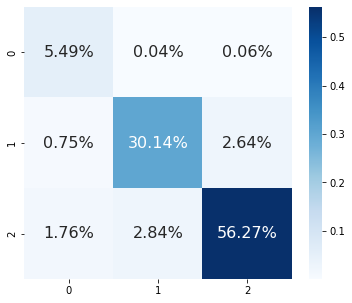

In [298]:
import seaborn as sns
import matplotlib.pyplot as plt

cf_matrix = confusion_matrix(y_test, y_true_pred)

plt.figure(figsize=(6, 5))
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,\
            fmt='.2%', cmap='Blues', annot_kws={'size':16})

In [299]:
#y_true_pred = np.argmax(y_preds, axis=1)
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, r2_score, mean_squared_error

accuracy = accuracy_score(y_test, y_true_pred)
print(f"Accuracy: {accuracy}")

print('Precision:', precision_score(y_test, y_true_pred, average='weighted'))
print('Recall:', recall_score(y_test, y_true_pred, average='weighted'))
print('F1-score:', f1_score(y_test, y_true_pred, average='weighted'))

# Evaluate the model performance using R-squared and RMSE metrics
print('R-squared score for id prediction:', r2_score(y_test, y_true_pred))
print('RMSE for id prediction:', mean_squared_error(y_test, y_true_pred, squared=False))

Accuracy: 0.9189938284531713
Precision: 0.9252476854415383
Recall: 0.9189938284531713
F1-score: 0.9204936715079387
R-squared score for id prediction: 0.622234973740759
RMSE for id prediction: 0.3683248079057385


#### Extra Informations

1.

#Option test 1:
model = Sequential() 

base_model = Dense(X_train.shape[1],activation='relu',input_shape=(X_train.shape[1],))
base_model.trainable = True

model.add(base_model)
model.add(Dense(256,activation='relu'))
model.add(Dense(128,activation='relu'))
model.add(Dense(3,activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)

#model training 
history2 = model.fit(X_train, y_train, validation_data=(X_val,y_val), epochs= initial_epochs, batch_size=1000, callbacks=[early_stop])

2.